In [284]:
import numpy as np
import pandas as pd
import datetime as dt
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import mean_squared_error
from collections import Counter

import os

from pandas.plotting import register_matplotlib_converters
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
font_path = '/Library/Fonts/NanumGothic.ttf'
font_name = fm.FontProperties(fname=font_path, size=10).get_name()
plt.rc('font', family=font_name, size=12)
plt.rcParams["figure.figsize"] = (30, 10)
register_matplotlib_converters()

plt.style.use('ggplot')
mpl.font_manager._rebuild()
mpl.pyplot.rc('font', family='NanumGothic')

from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

In [2]:
FLOWTIME_PATH = '/Users/minki/pythonworkspace/bigcon2020/2020dataset/SK_data/FLOW_TIME'
FLOWAGE_PATH = '/Users/minki/pythonworkspace/bigcon2020/2020dataset/SK_data/FLOW_AGE'

In [3]:
# 유동인구 데이터

sk_data_TIME = pd.read_excel(f'{FLOWTIME_PATH}/SK_TIME_DATA.xlsx')
sk_data_AGE = pd.read_excel(f'{FLOWAGE_PATH}/SK_AGE_DATA.xlsx')

del sk_data_TIME['Unnamed: 0']
del sk_data_AGE['Unnamed: 0']

# 소비자물가지수
consumer = pd.read_excel('/Users/minki/pythonworkspace/bigcon2020/2020dataset/counsumer_index.xlsx')
consumer_2019 = consumer.iloc[:, :14]
consumer_2020 = consumer.iloc[:, [0, 1, 14, 15, 16, 17, 18, 19, 20]]

# 온라인쇼핑몰 운영형태
online_shop = pd.read_excel('/Users/minki/pythonworkspace/bigcon2020/2020dataset/온라인쇼핑몰_운영형태_상품군별거래액.xlsx')

# cj 물류 데이터
cj_shop = pd.read_excel('/Users/minki/pythonworkspace/bigcon2020/2020dataset/CJ_data/CJ_data.xlsx')

# gs 유통 데이터
gs_category = pd.read_excel("/Users/minki/pythonworkspace/bigcon2020/2020dataset/GS_data/04_혁신아이디어분야_유통데이터(GS리테일)_데이터정의서 및 문제 데이터.xlsx", sheet_name='카테고리별 매출비중')
gs_dong = pd.read_excel("/Users/minki/pythonworkspace/bigcon2020/2020dataset/GS_data/04_혁신아이디어분야_유통데이터(GS리테일)_데이터정의서 및 문제 데이터.xlsx", sheet_name='동별매출지수', header=[3])
gs_total = pd.read_excel("/Users/minki/pythonworkspace/bigcon2020/2020dataset/GS_data/04_혁신아이디어분야_유통데이터(GS리테일)_데이터정의서 및 문제 데이터.xlsx", sheet_name='종합테이블(TB_DD_STR_PURCH_CLS)')

# 신한카드 데이터
resident = pd.read_csv('/Users/minki/pythonworkspace/bigcon2020/csv_files/카드_내국인.csv', encoding = 'utf-8')
del resident['Unnamed: 0']

foreigner = pd.read_csv('/Users/minki/pythonworkspace/bigcon2020/csv_files/카드_외국인.csv', encoding = 'utf-8')
del foreigner['Unnamed: 0']

In [4]:
# covid19 data load

# data load
covid = pd.read_excel('/Users/minki/pythonworkspace/bigcon2020/2020dataset/accumulate_covid.xlsx')
covid = covid.iloc[:, [0, 1, 3]]

covid = covid.rename(columns = {'날짜' : 'date', '서울 누적':'accumulate_seoul', '대구 누적':'accumulate_daegu'})

# 첫 행 삭제
covid = covid[1:]

# datetype으로 변경
covid['date'] = pd.to_datetime(covid['date'], format = '%Y%m%d')
covid.index = covid['date']

# 데이터 범위 조정
covid = covid['2020-02-01':'2020-05-31']
covid = covid.fillna(0)

# 코로나 누적 데이터 서울, 대구 분리
covid_SEOUL = covid[['accumulate_seoul']]
covid_DAEGU = covid[['accumulate_daegu']]

# 코로나 일별 확진자 데이터 load
covid_daily = pd.read_csv('/Users/minki/pythonworkspace/bigcon2020/csv_files/covid19_일별확진자.csv')
covid_daily = covid_daily.rename(columns = {'날짜' : 'STD_YMD'})
covid_daily.STD_YMD = covid_daily.STD_YMD.map(lambda x : x[:10])
covid_daily_SEOUL = covid_daily[['STD_YMD','서울 누적']].iloc[8:-53, :]
covid_daily_DAEGU = covid_daily[['STD_YMD', '대구 누적']].iloc[8:-53, :]

covid_daily_SEOUL.index = covid_daily_SEOUL.STD_YMD
covid_daily_DAEGU.index = covid_daily_DAEGU.STD_YMD

covid_daily_SEOUL = covid_daily_SEOUL[['서울 누적']]
covid_daily_DAEGU = covid_daily_DAEGU[['대구 누적']]

# 1. sk 데이터 전처리

In [24]:
# 시간별 유동인구 데이터 전처리

sk_data_TIME_Dong = sk_data_TIME.groupby(['HDONG_NM', 'STD_YMD']).sum()
sk_data_TIME_Dong.reset_index(level=['HDONG_NM'], inplace = True)
sk_data_TIME_Dong.reset_index(level=['STD_YMD'], inplace = True)

In [25]:
# 연령별 유동인구 데이터 전처리

sk_data_AGE_Dong = sk_data_AGE.groupby(['HDONG_NM', 'STD_YMD']).sum()
sk_data_AGE_Dong.reset_index(level=['HDONG_NM'], inplace = True)
sk_data_AGE_Dong.reset_index(level=['STD_YMD'], inplace = True)

In [26]:
sk_dong = list(dict(Counter(sk_data_TIME_Dong.HDONG_NM)).keys())

In [27]:
sk_data_TIME_Dong.index = sk_data_TIME_Dong.index.map(lambda x : str(x))

In [28]:
del sk_data_TIME_Dong['STD_YM']
del sk_data_TIME_Dong['HDONG_CD']

In [29]:
del sk_data_AGE_Dong['STD_YM']
del sk_data_AGE_Dong['HDONG_CD']

In [ ]:
sk_data_TIME_Dong.STD_YMD = sk_data_TIME_Dong.STD_YMD.map(lambda x: str(x))

In [105]:
sk_data_AGE_Dong.STD_YMD = sk_data_AGE_Dong.STD_YMD.map(lambda x: str(x))

# 1-2. sk 데이터 이상치 제거

scaler = standardscaler

method = isolation forest

In [292]:
sk_dongs = list(Counter(sk_data_TIME_Dong.HDONG_NM).keys())

In [295]:
sk_dongs[:1]

['고산1동']

Counter({1: 233, -1: 8})


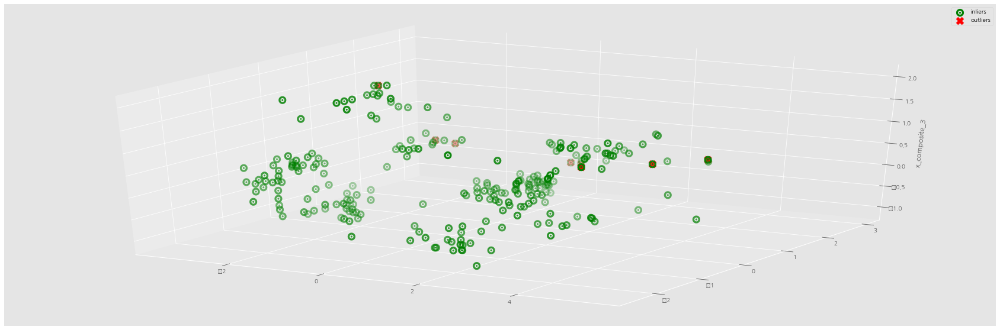

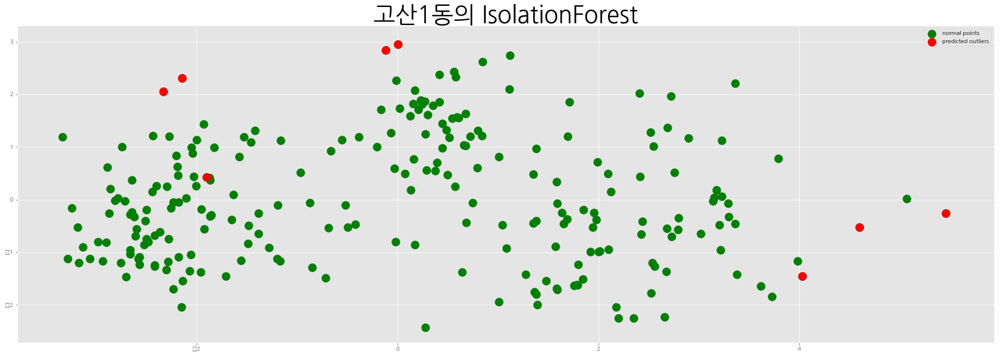

Counter({1: 233, -1: 8})


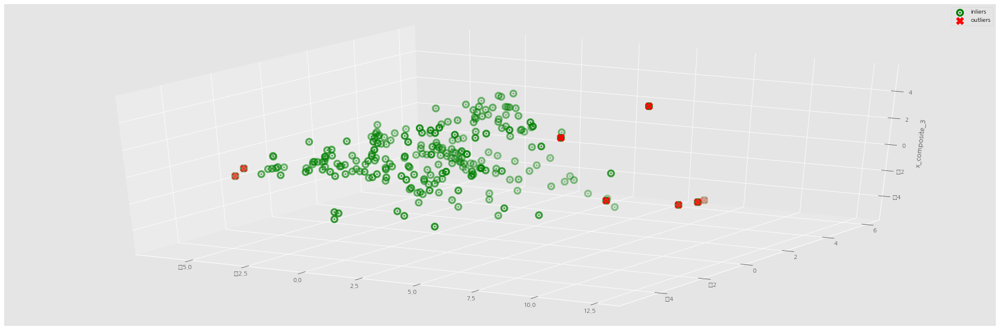

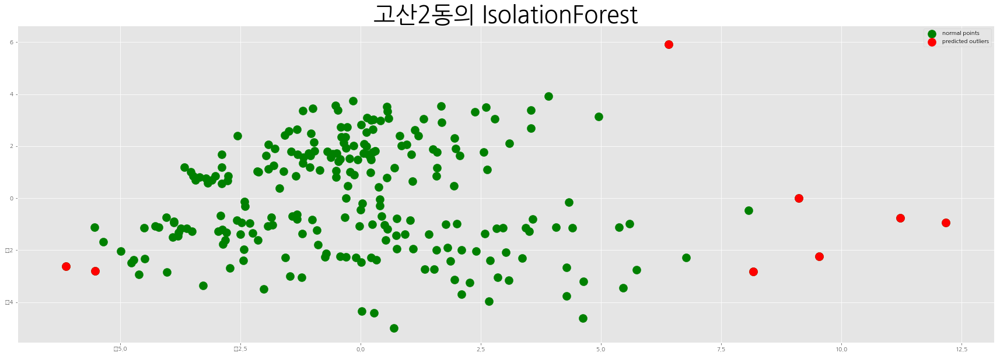

Counter({1: 233, -1: 8})


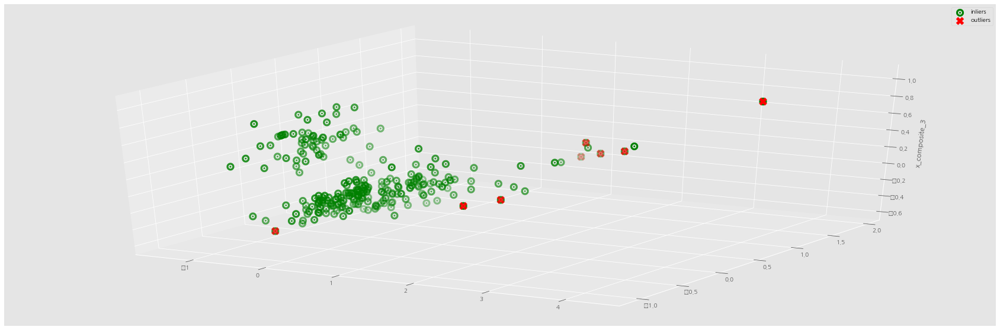

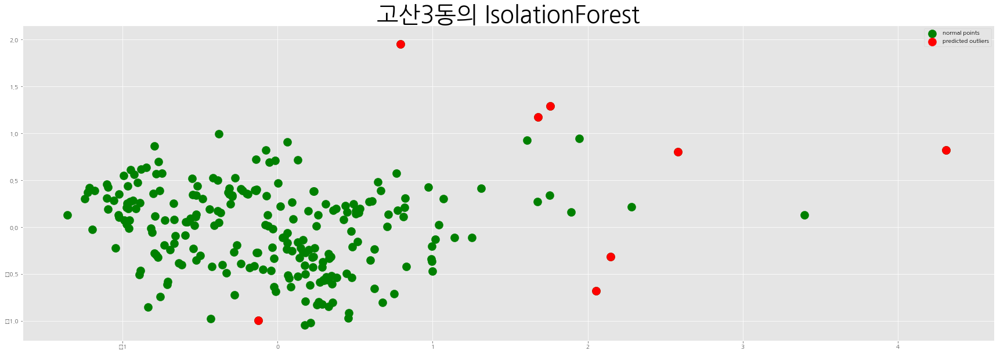

Counter({1: 233, -1: 8})


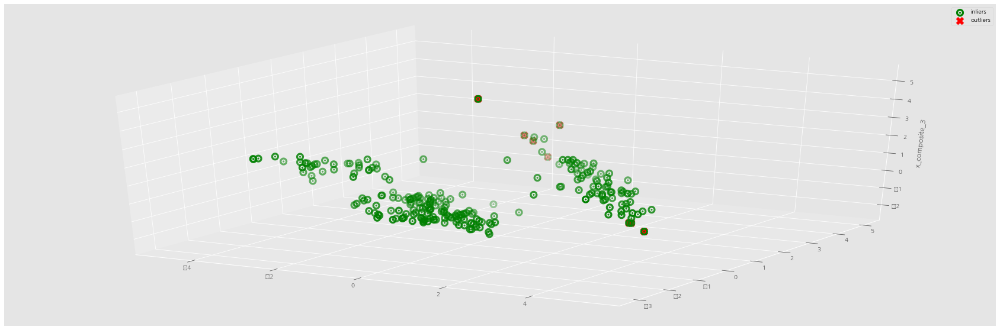

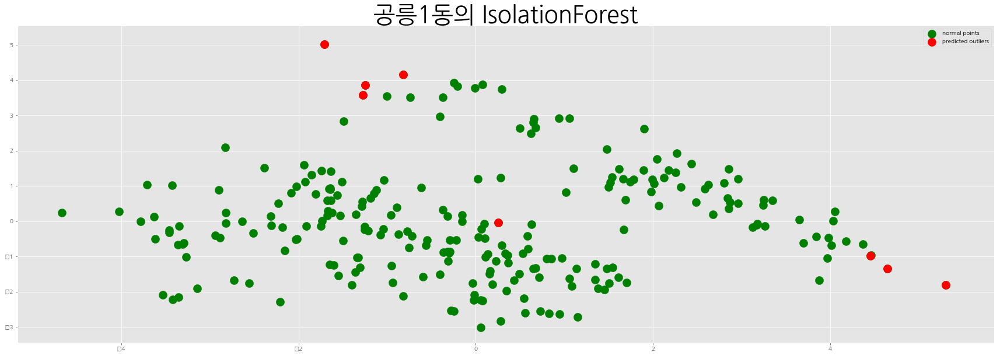

Counter({1: 233, -1: 8})


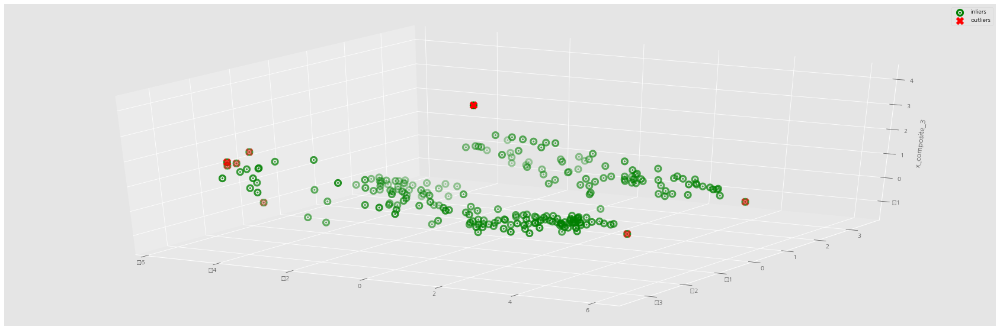

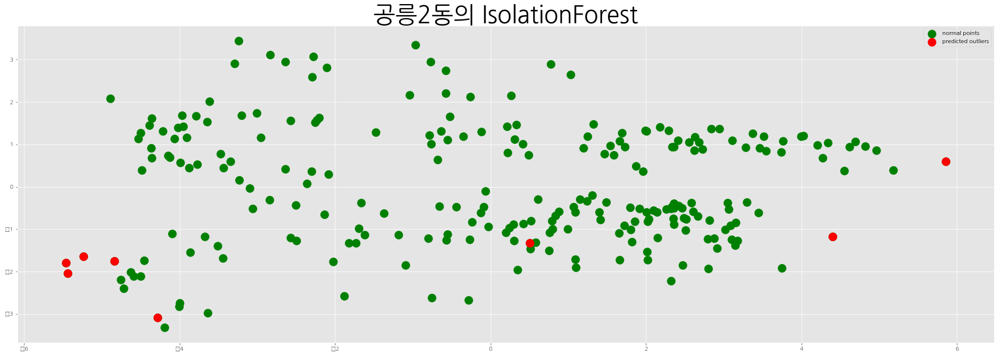

Counter({1: 233, -1: 8})


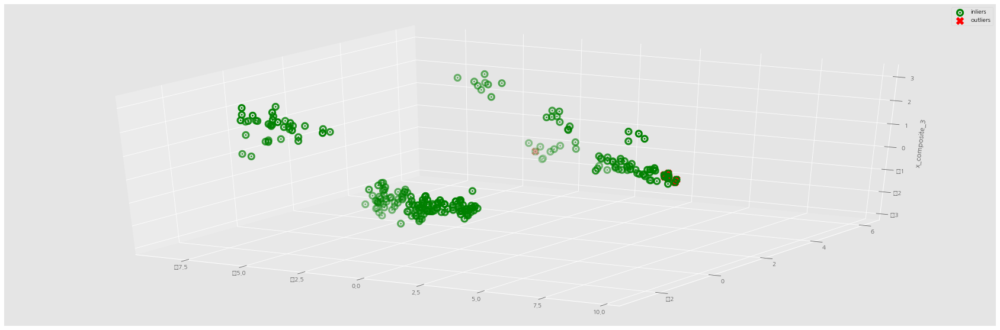

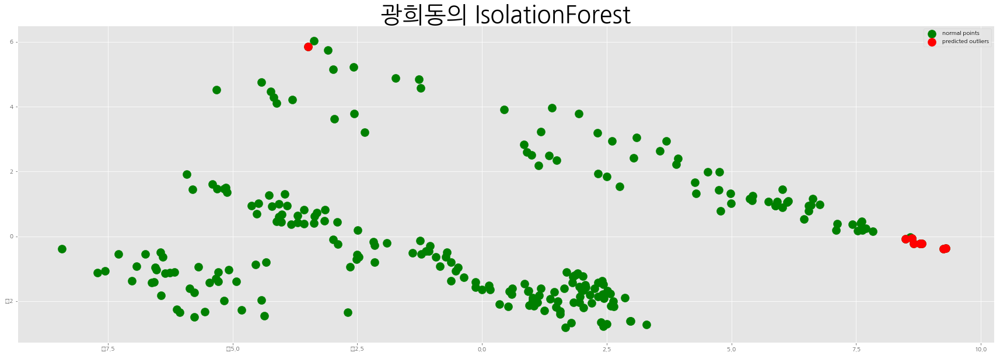

Counter({1: 233, -1: 8})


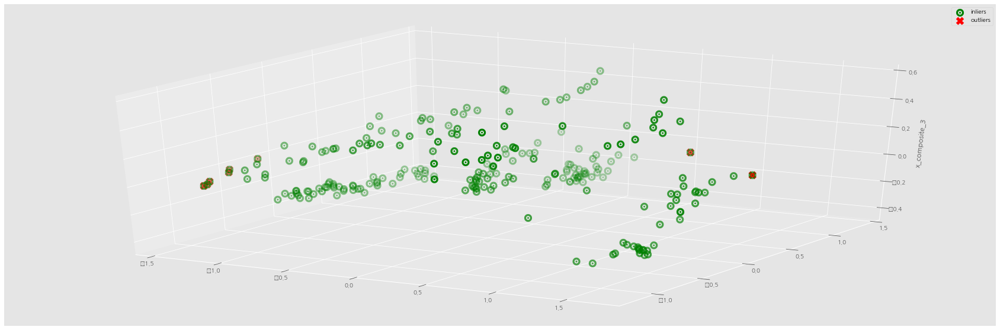

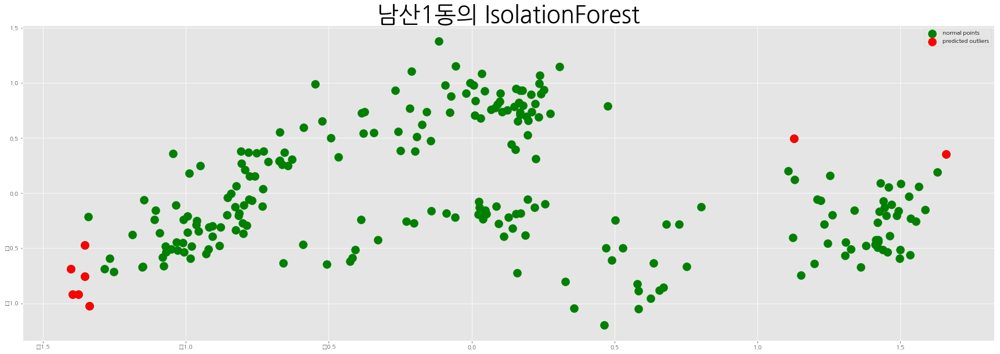

Counter({1: 233, -1: 8})


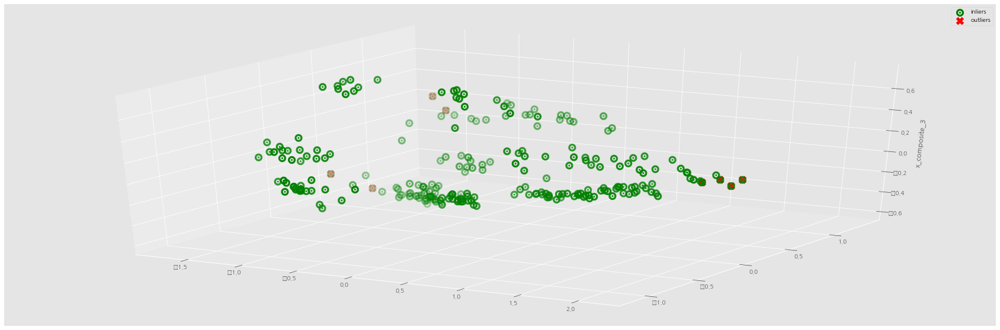

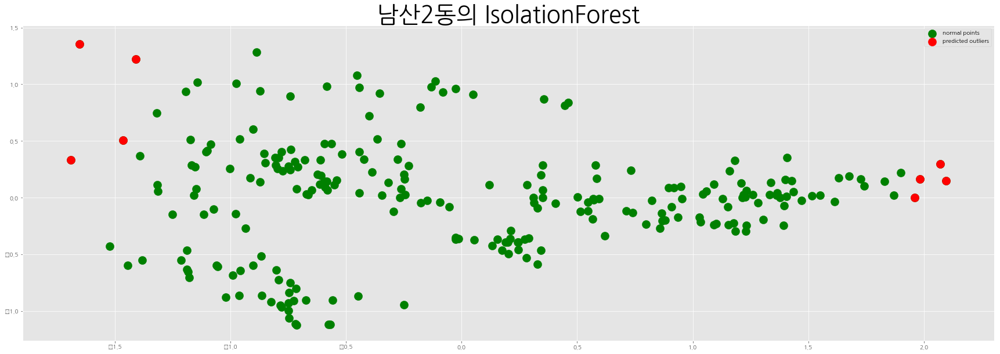

Counter({1: 233, -1: 8})


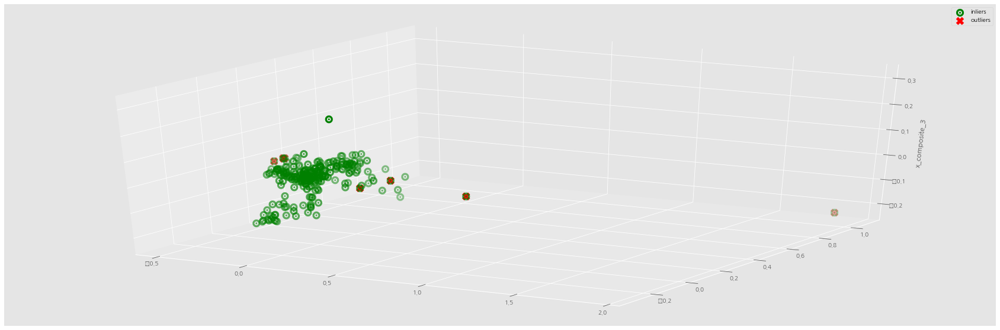

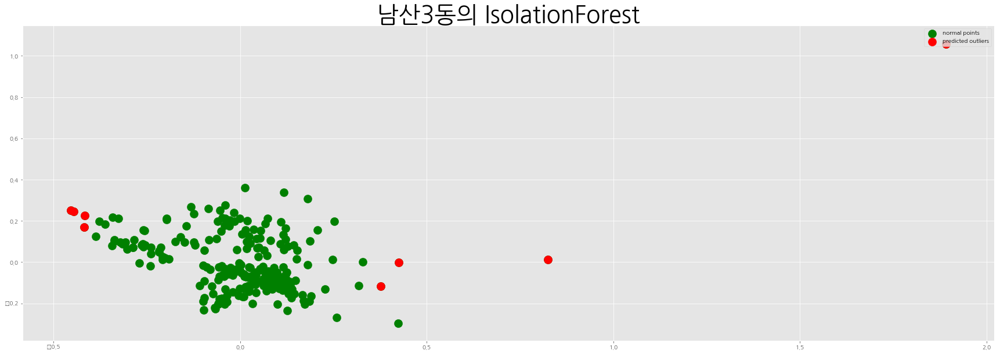

Counter({1: 233, -1: 8})


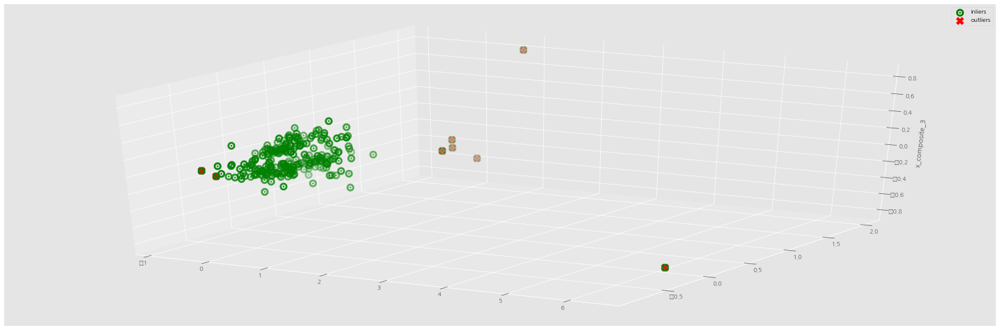

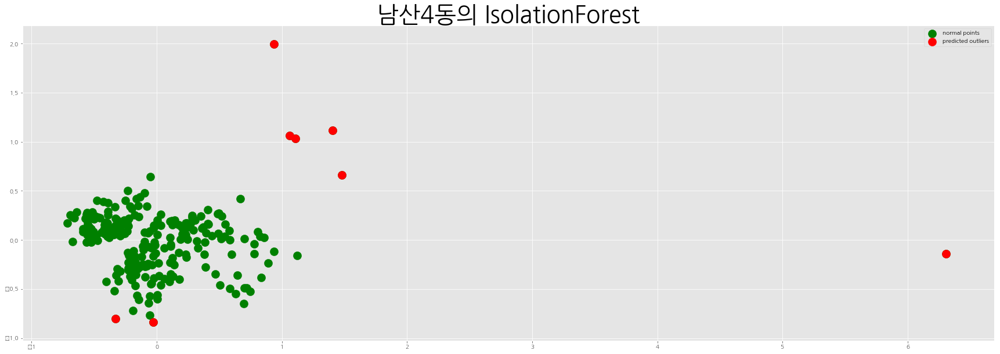

Counter({1: 233, -1: 8})


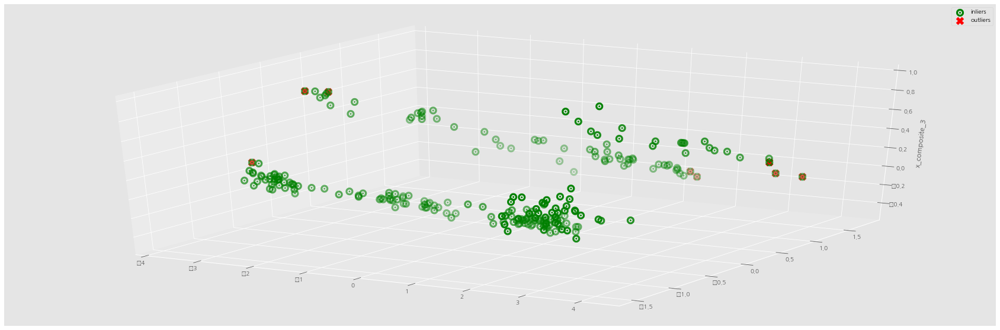

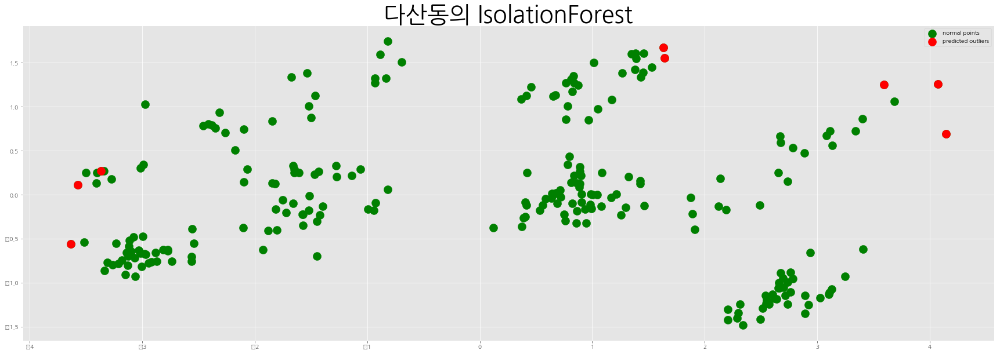

Counter({1: 233, -1: 8})


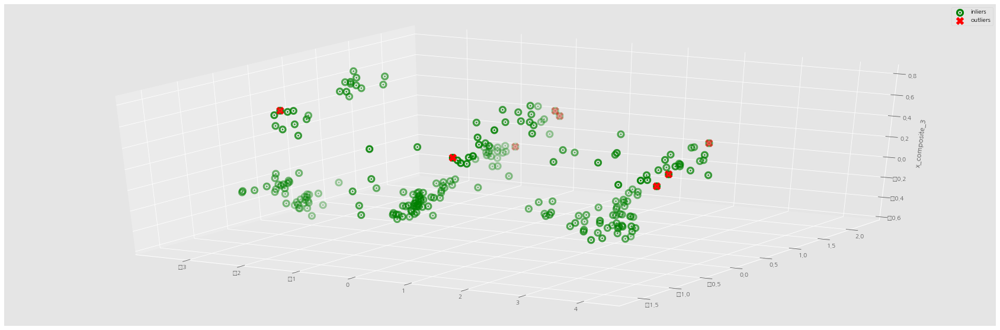

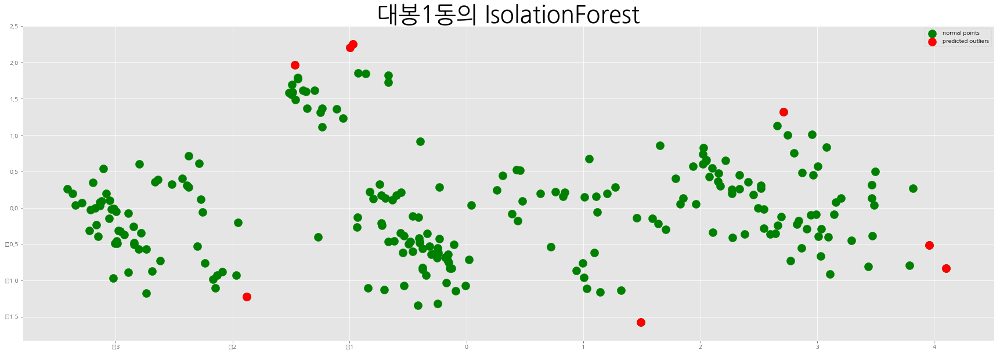

Counter({1: 233, -1: 8})


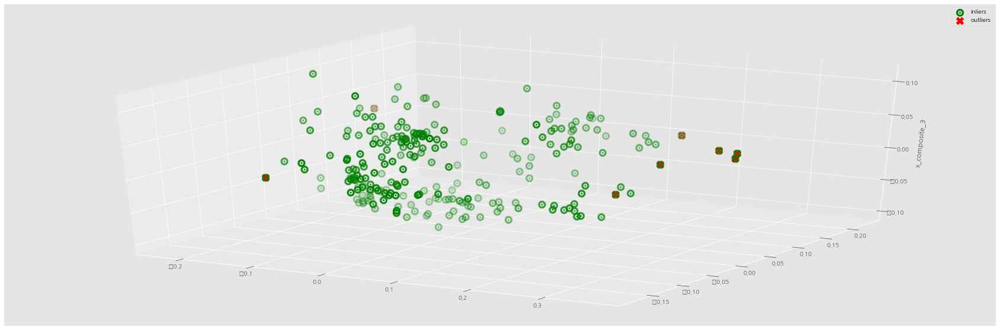

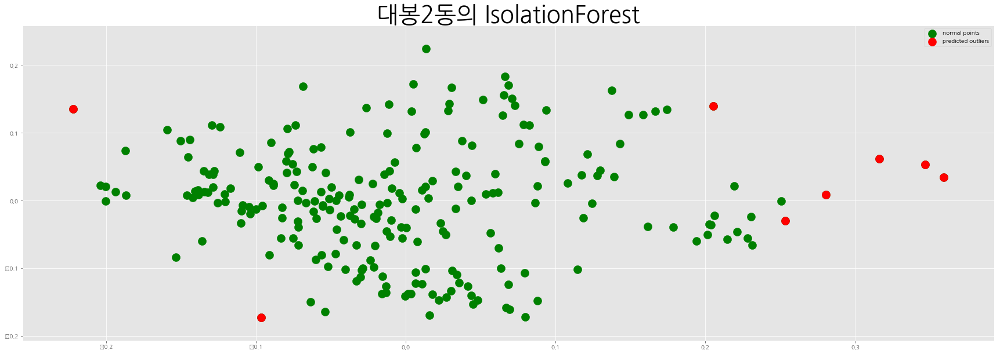

Counter({1: 233, -1: 8})


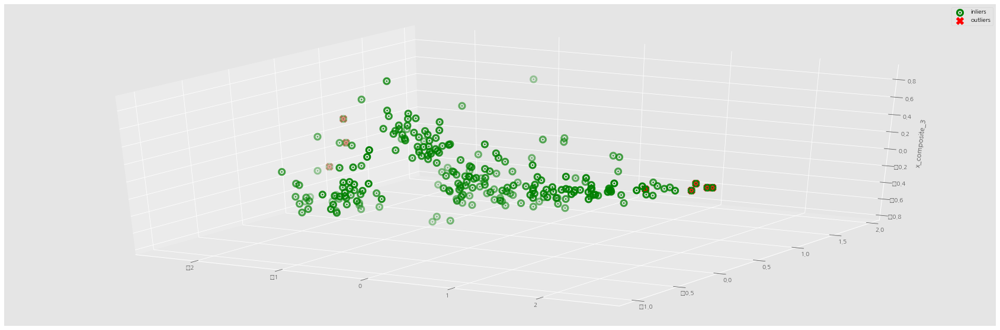

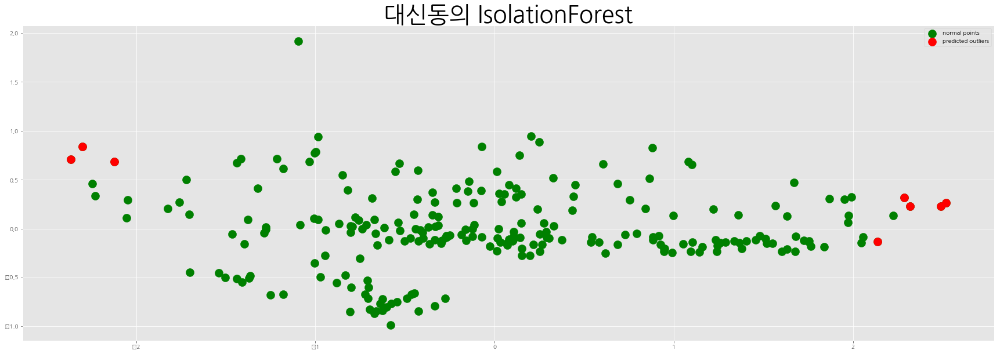

Counter({1: 233, -1: 8})


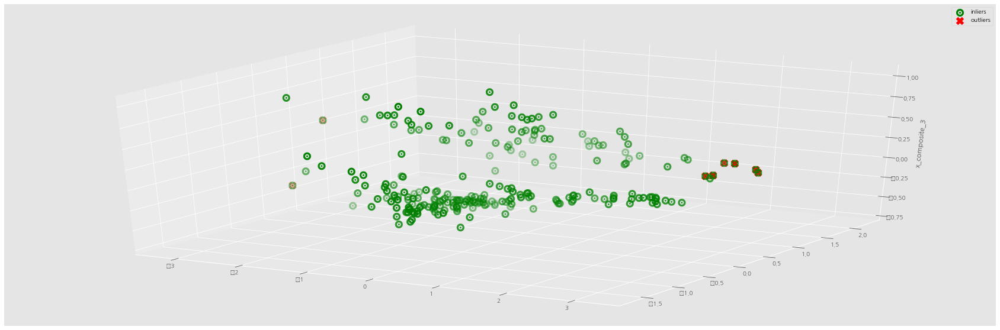

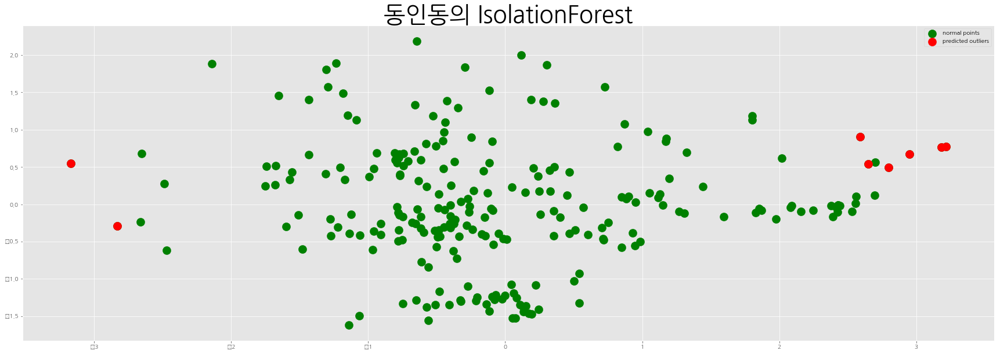

Counter({1: 233, -1: 8})


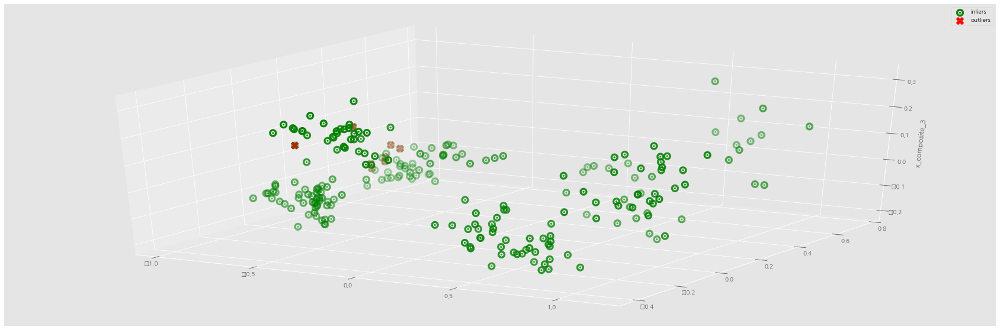

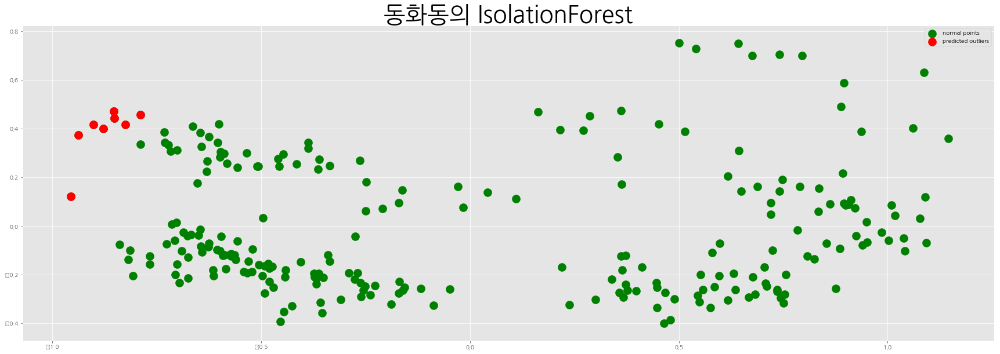

Counter({1: 233, -1: 8})


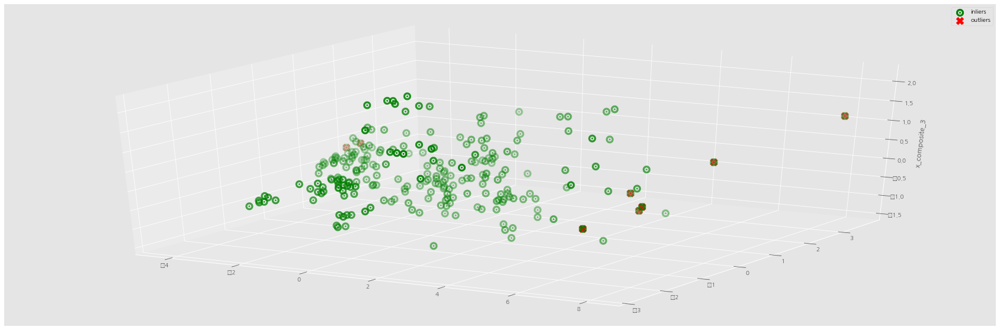

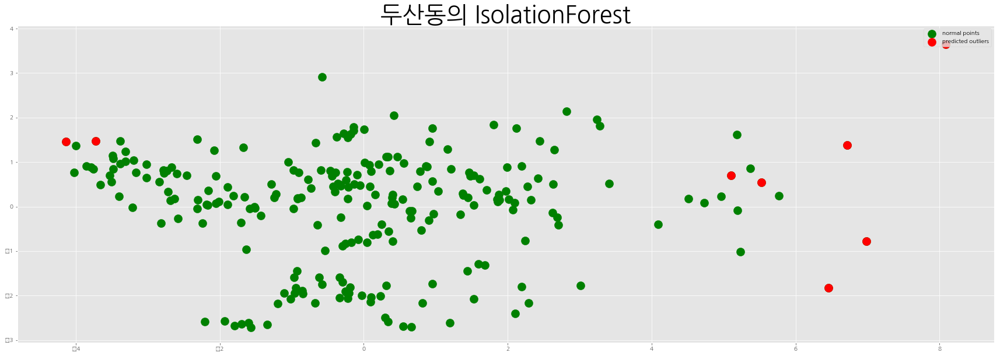

Counter({1: 233, -1: 8})


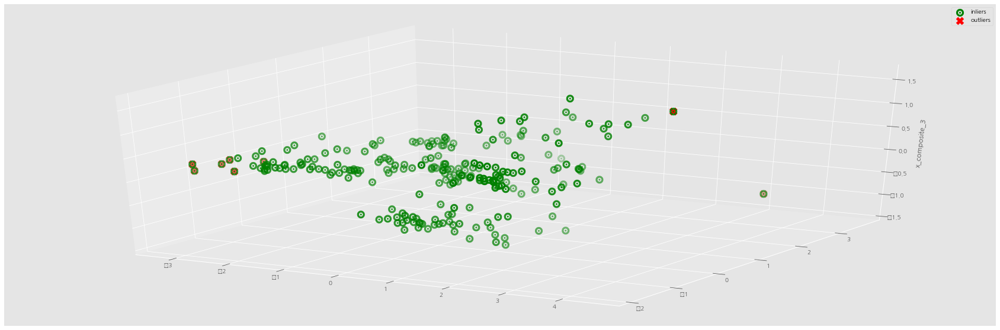

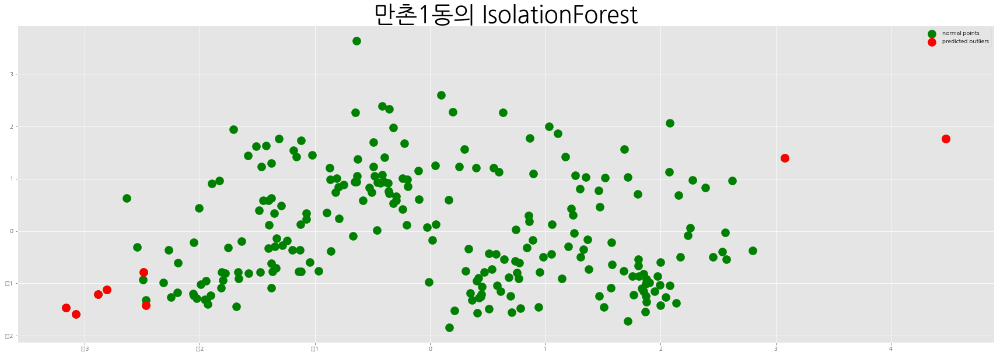

Counter({1: 233, -1: 8})


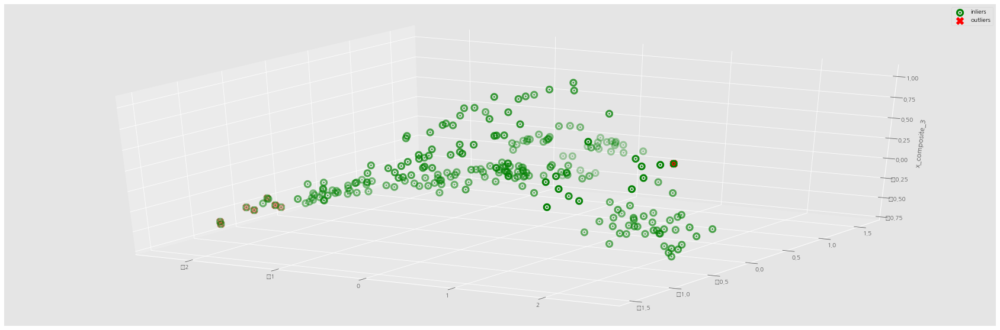

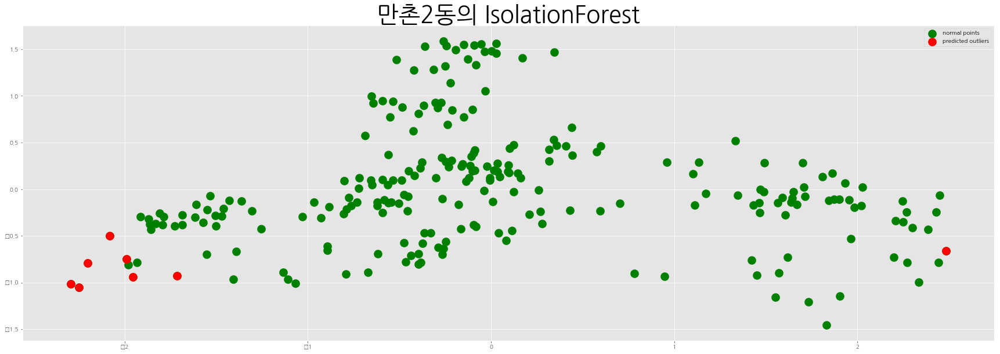

Counter({1: 233, -1: 8})


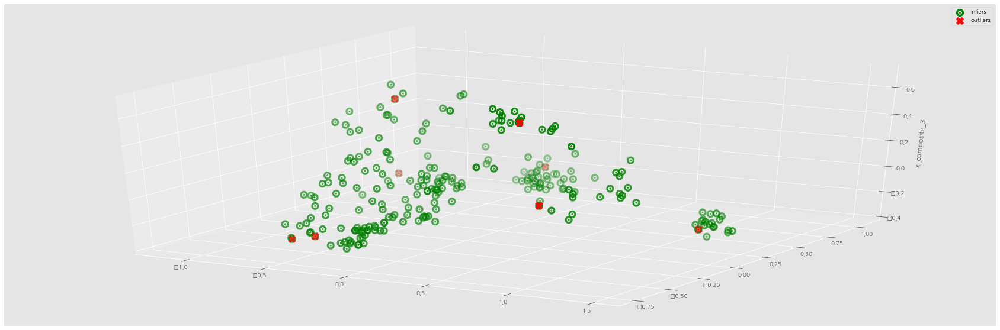

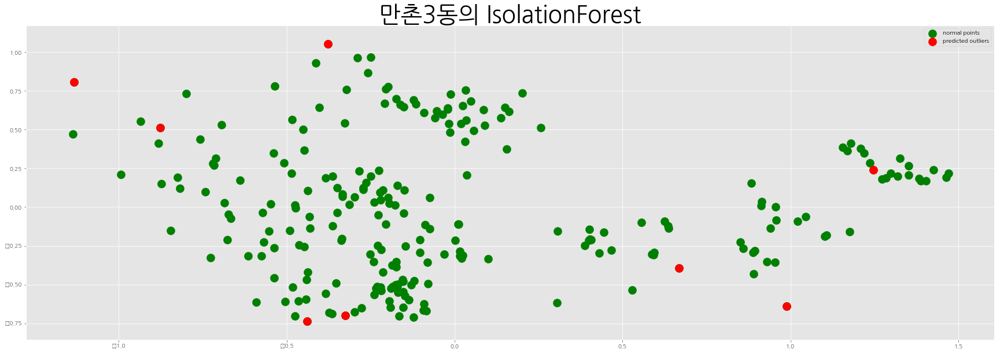

Counter({1: 233, -1: 8})


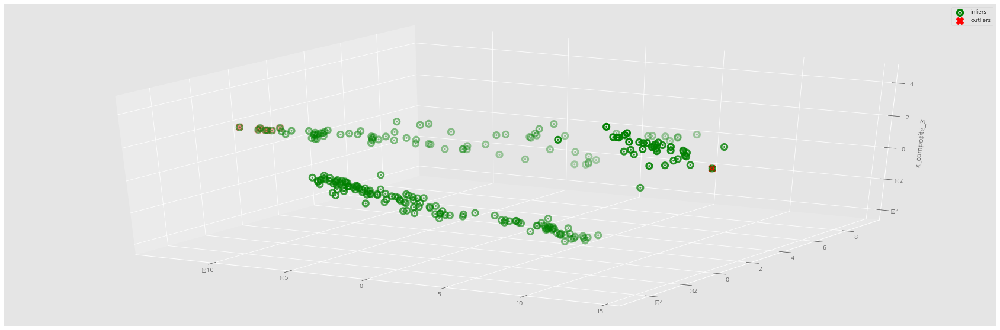

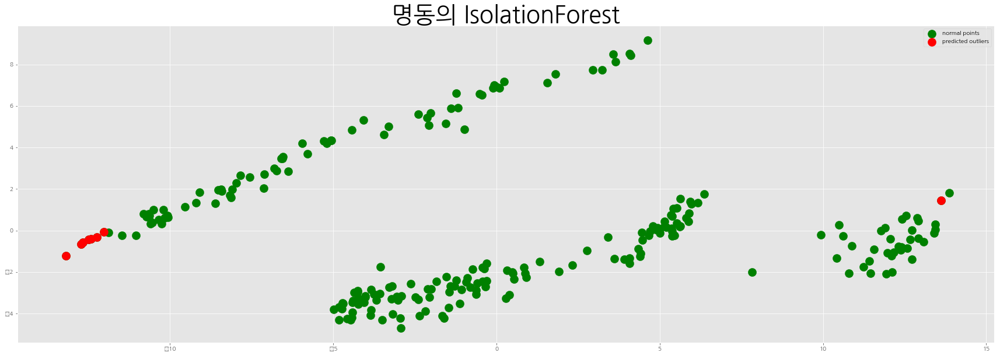

Counter({1: 233, -1: 8})


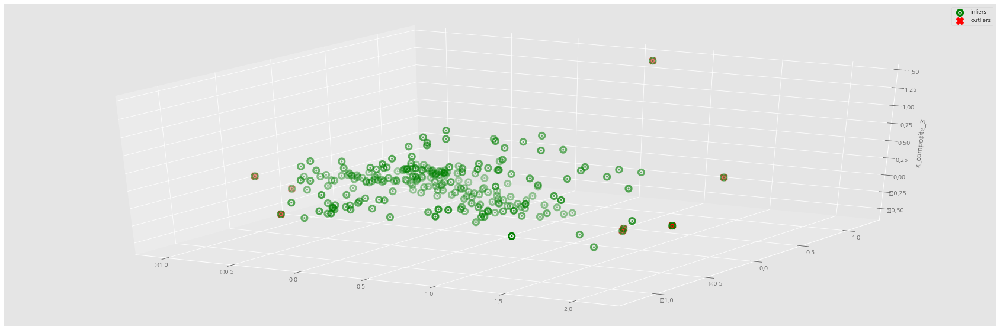

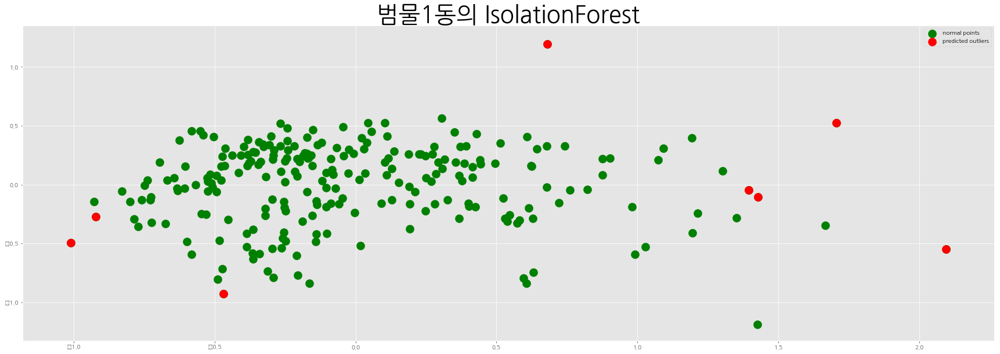

Counter({1: 233, -1: 8})


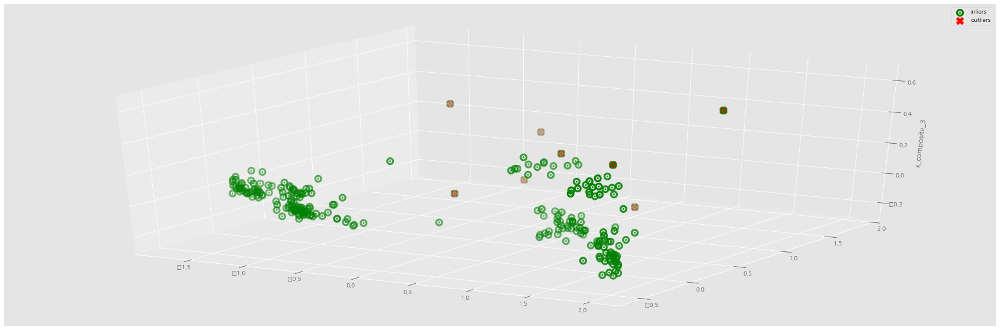

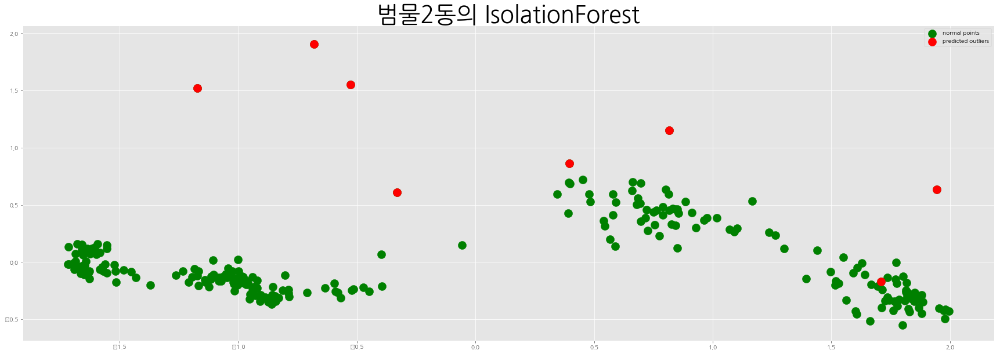

Counter({1: 233, -1: 8})


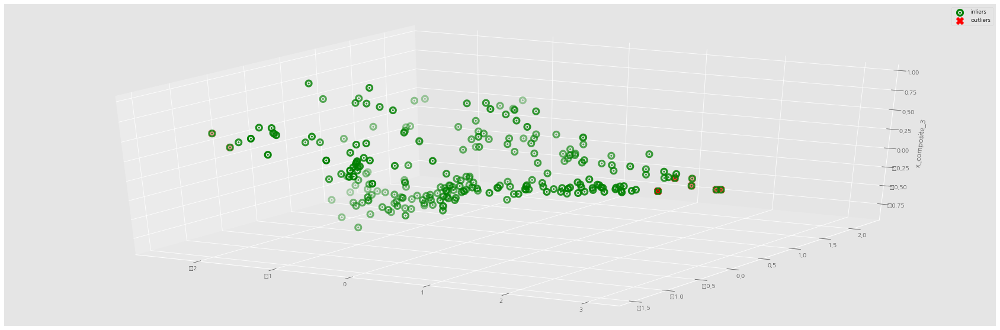

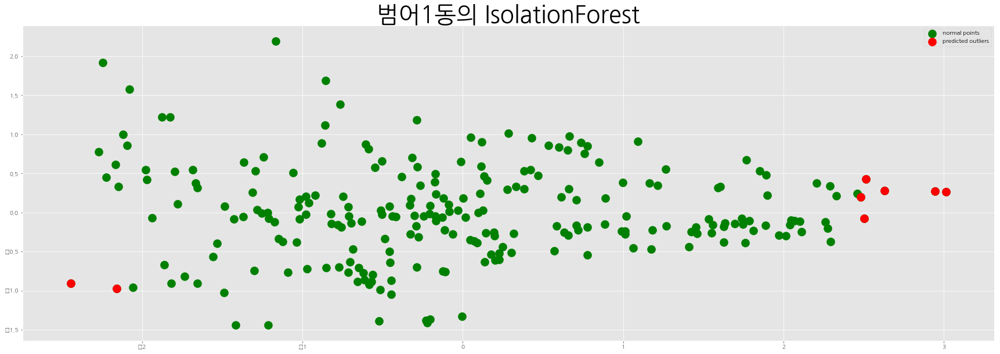

Counter({1: 233, -1: 8})


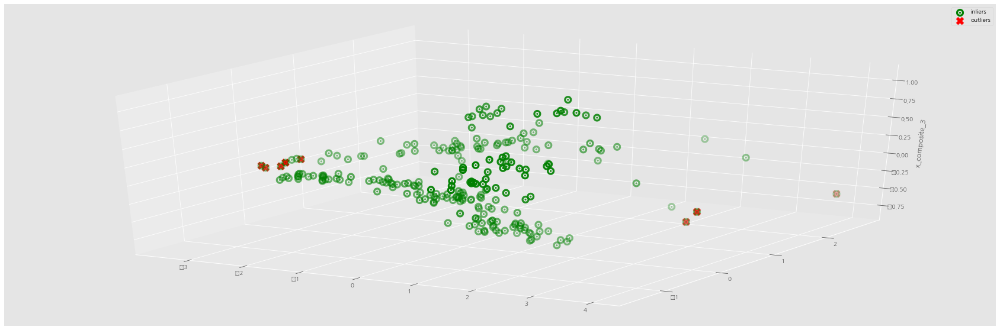

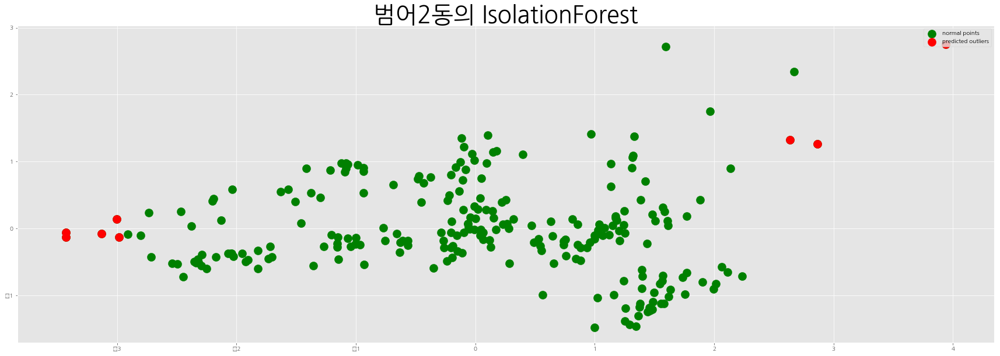

Counter({1: 233, -1: 8})


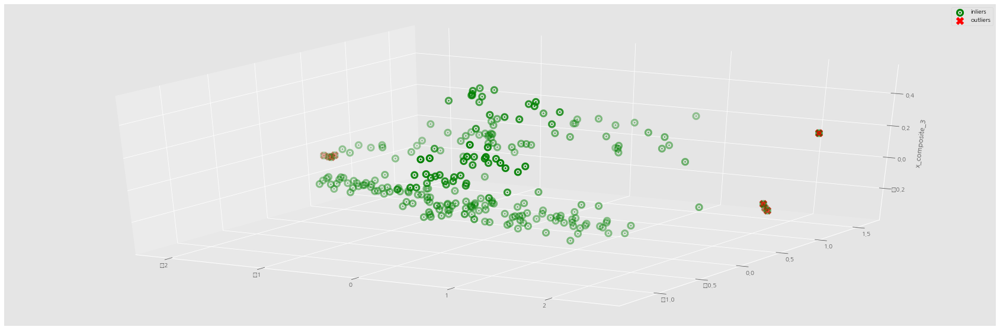

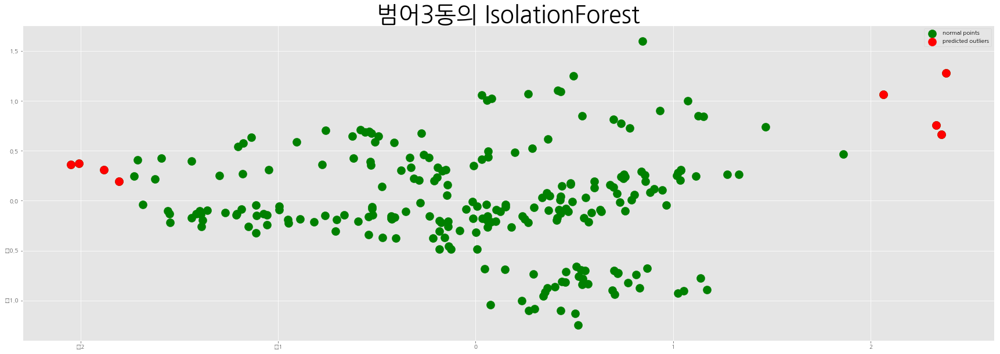

Counter({1: 233, -1: 8})


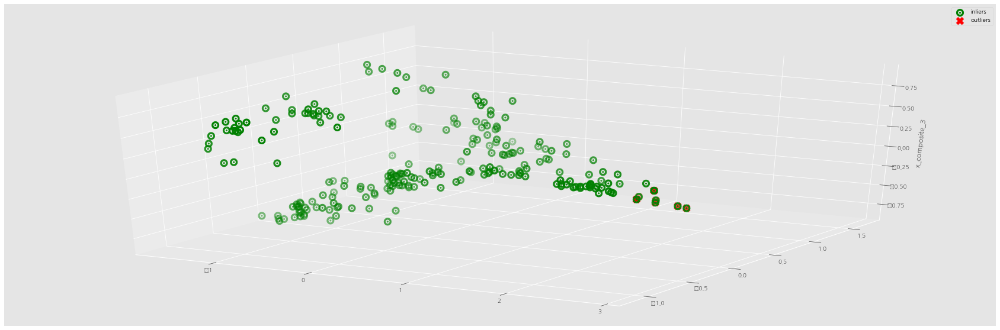

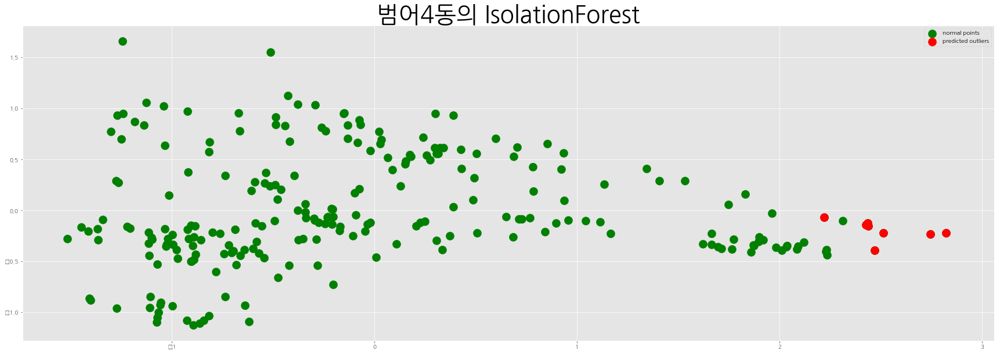

Counter({1: 233, -1: 8})


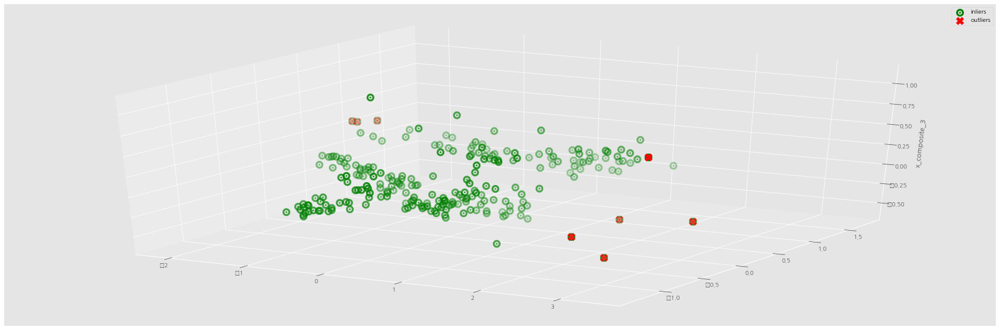

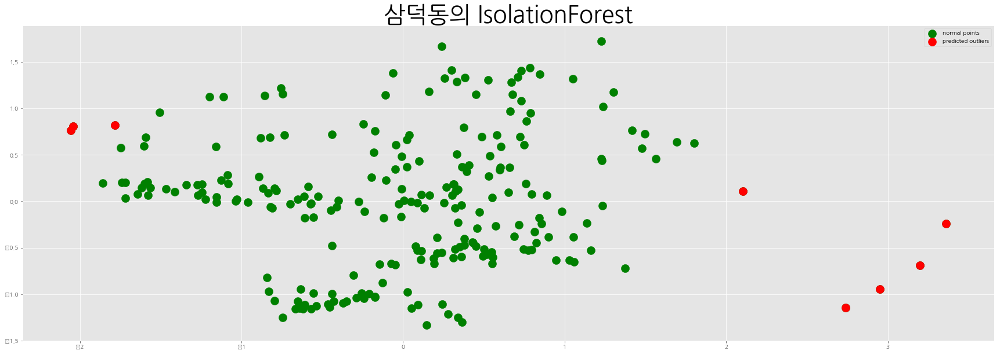

Counter({1: 233, -1: 8})


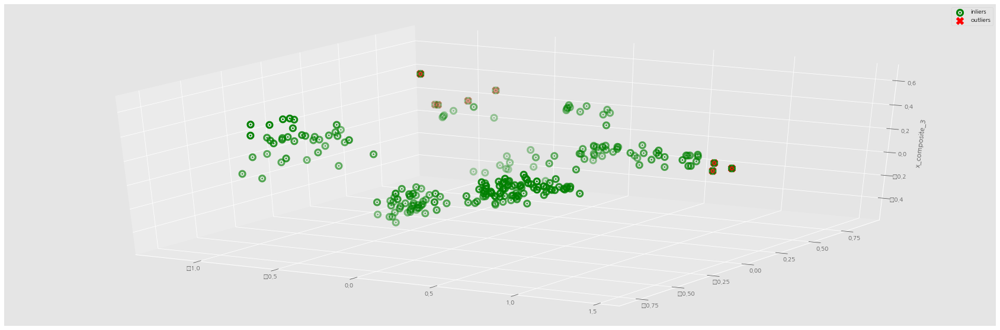

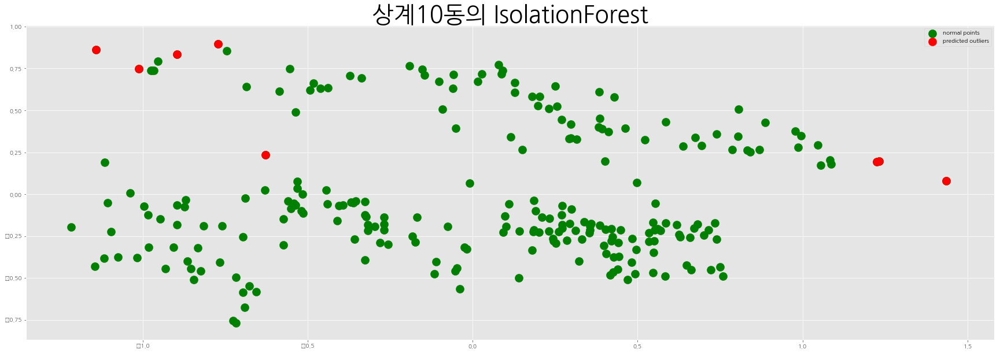

Counter({1: 233, -1: 8})


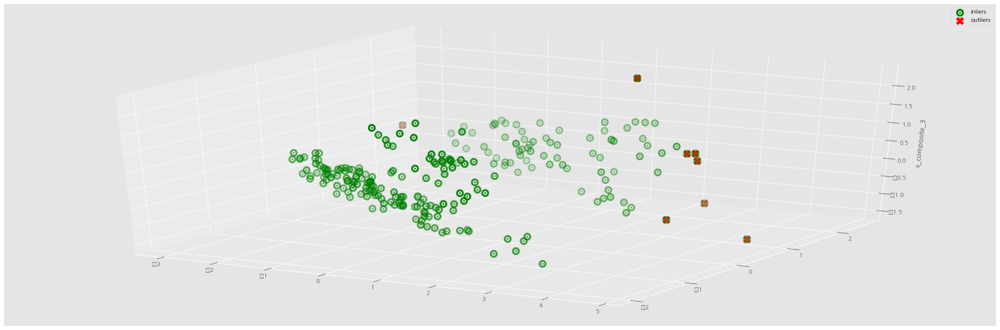

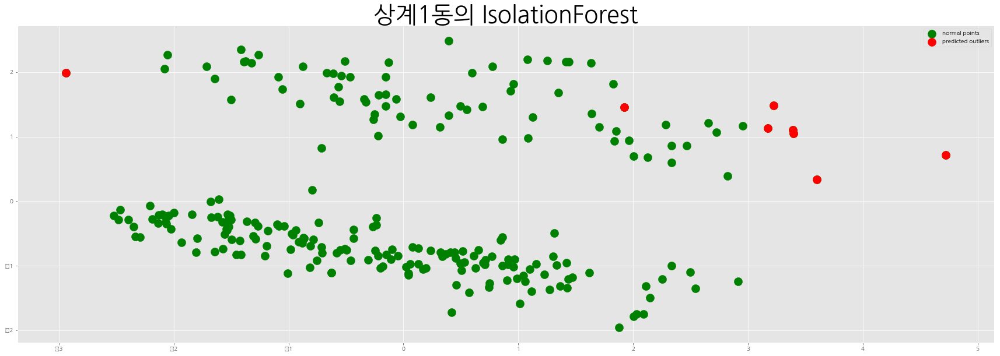

Counter({1: 233, -1: 8})


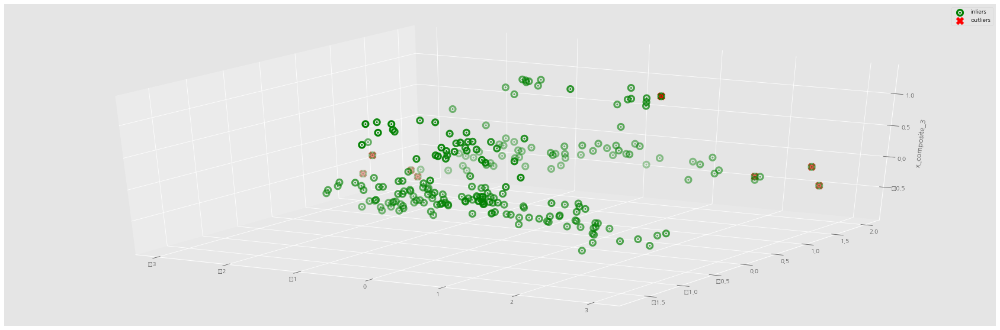

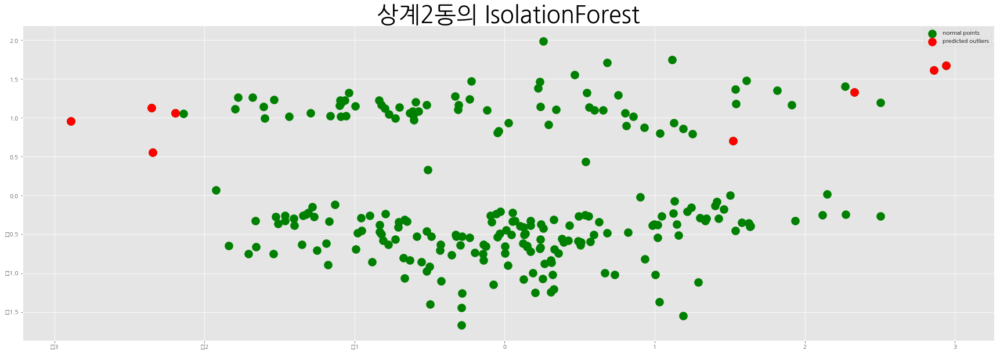

Counter({1: 233, -1: 8})


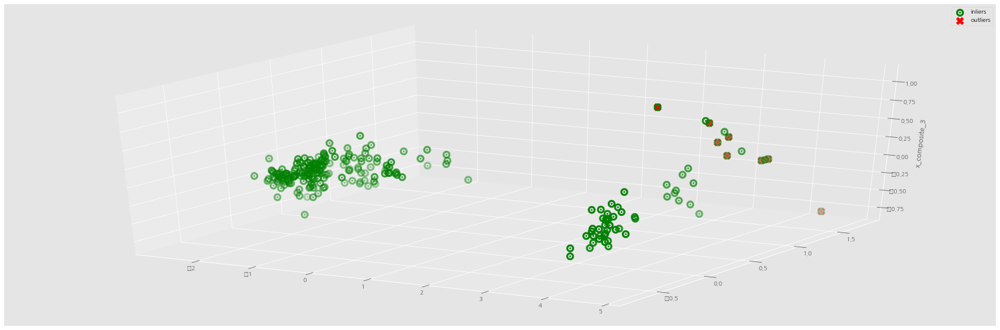

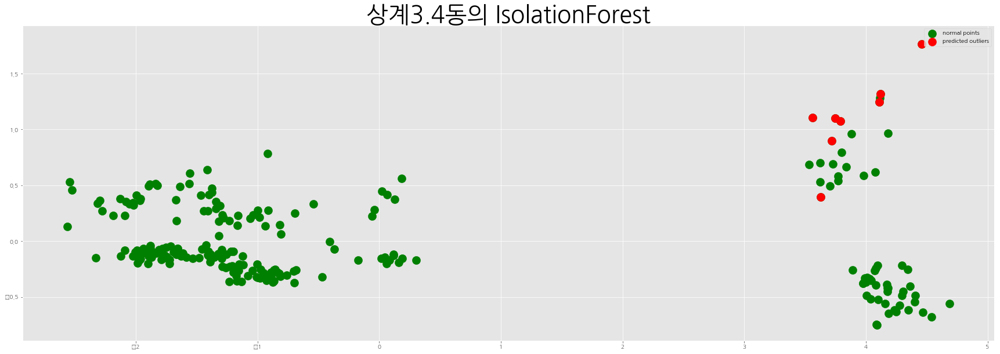

Counter({1: 233, -1: 8})


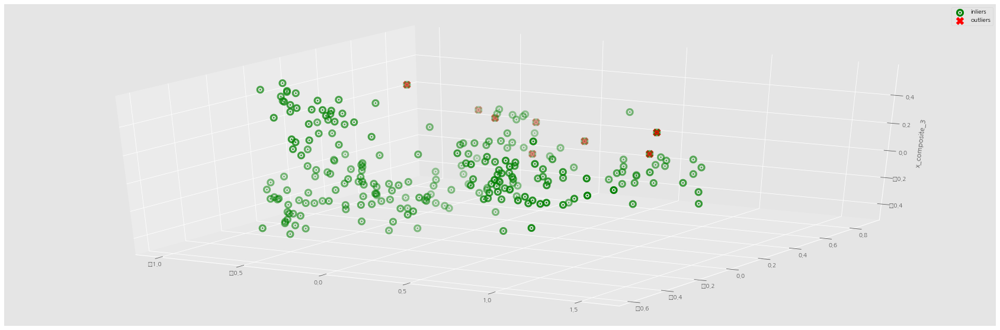

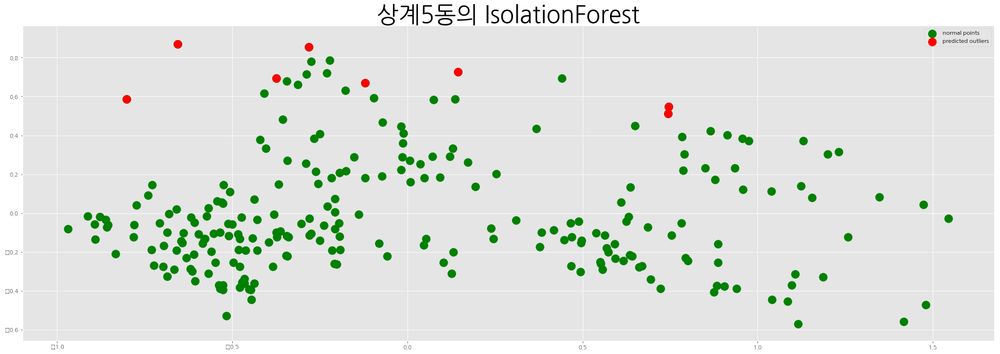

Counter({1: 233, -1: 8})


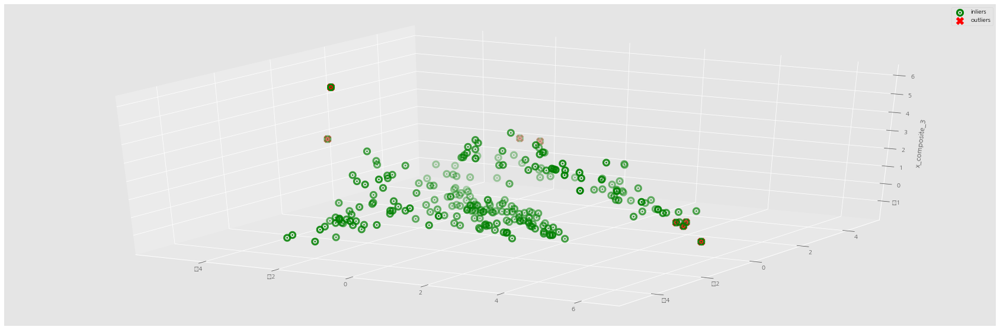

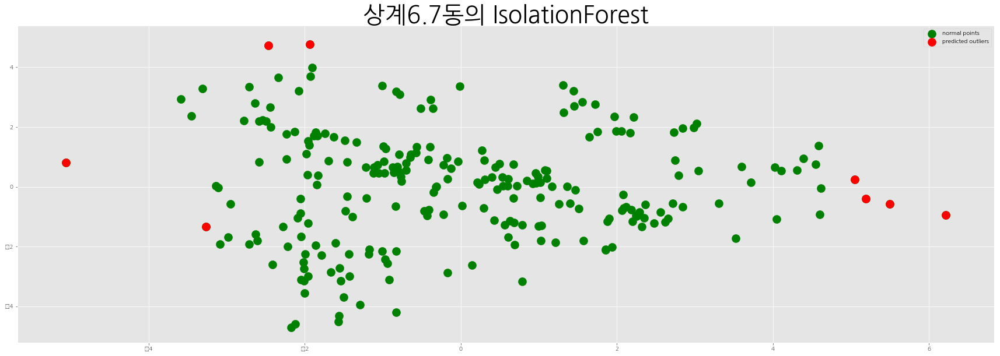

Counter({1: 233, -1: 8})


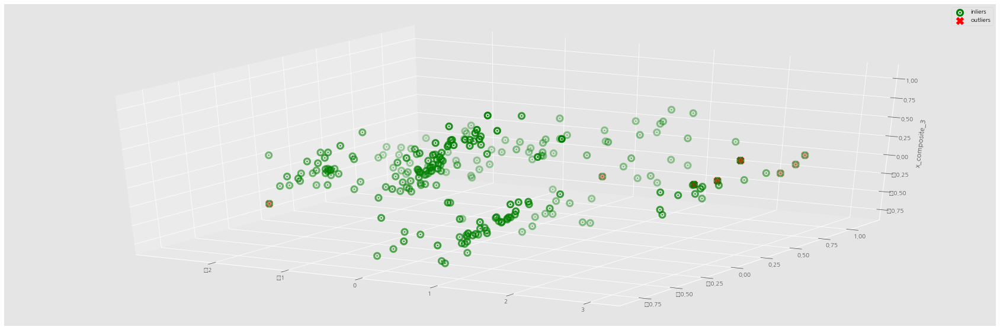

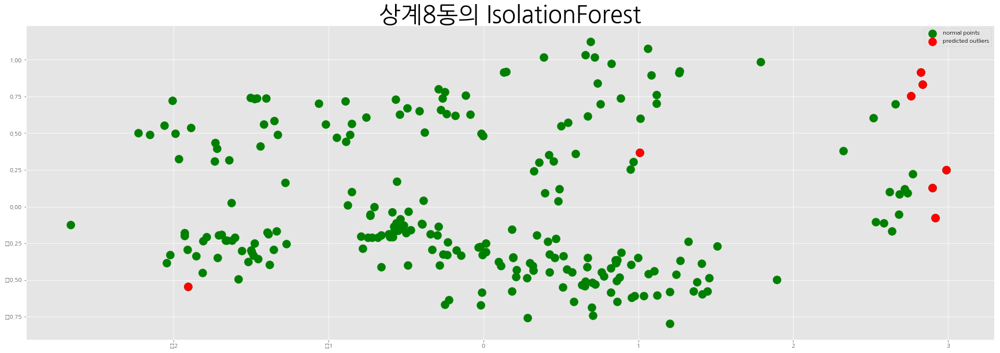

Counter({1: 233, -1: 8})


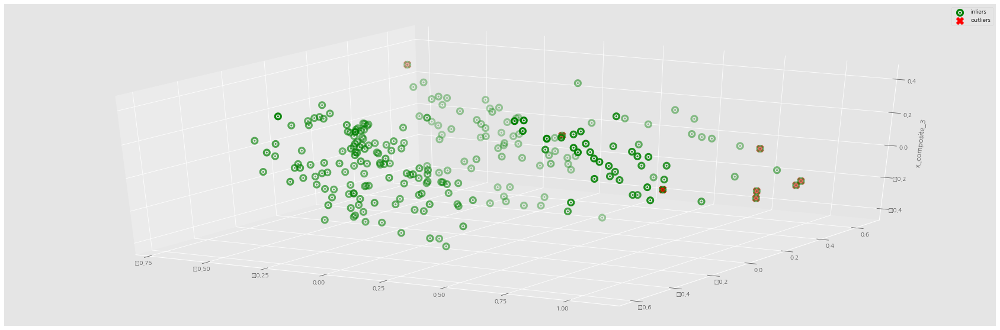

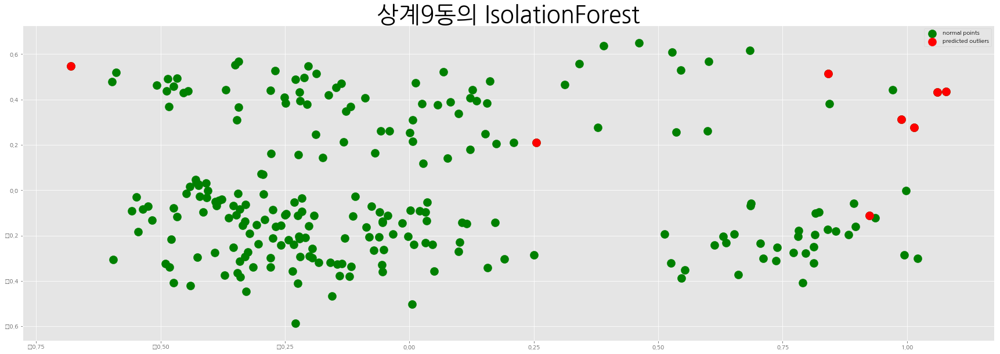

Counter({1: 233, -1: 8})


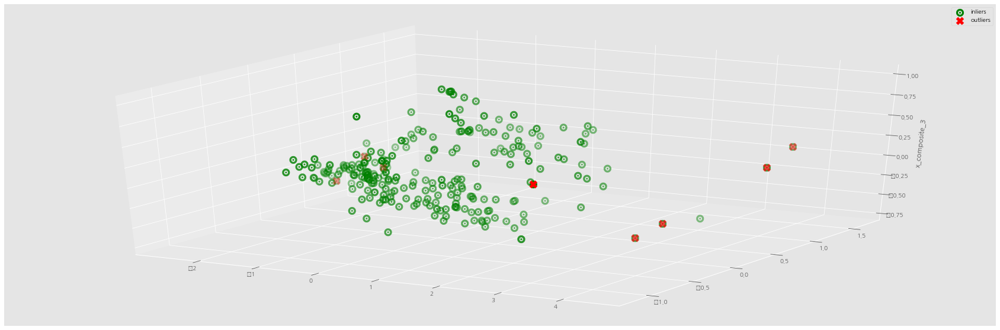

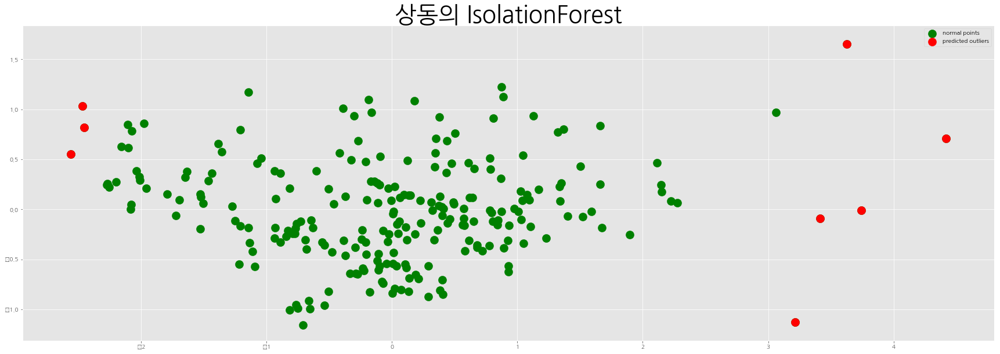

Counter({1: 233, -1: 8})


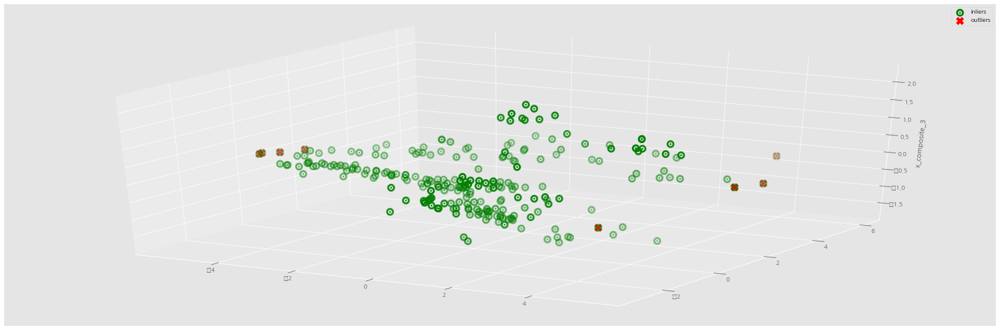

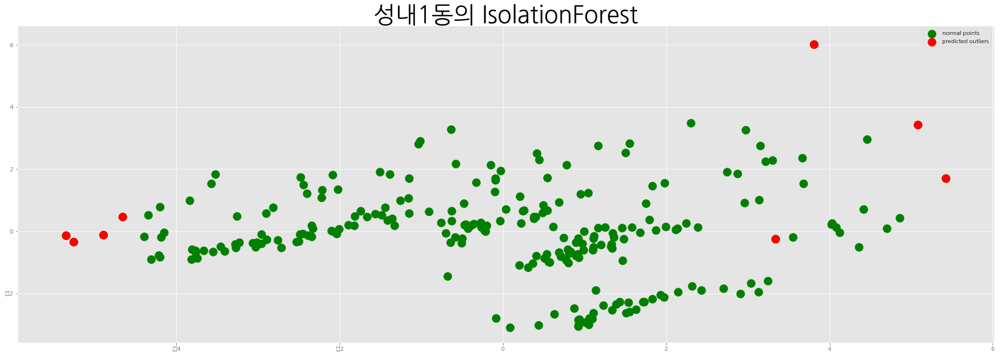

Counter({1: 233, -1: 8})


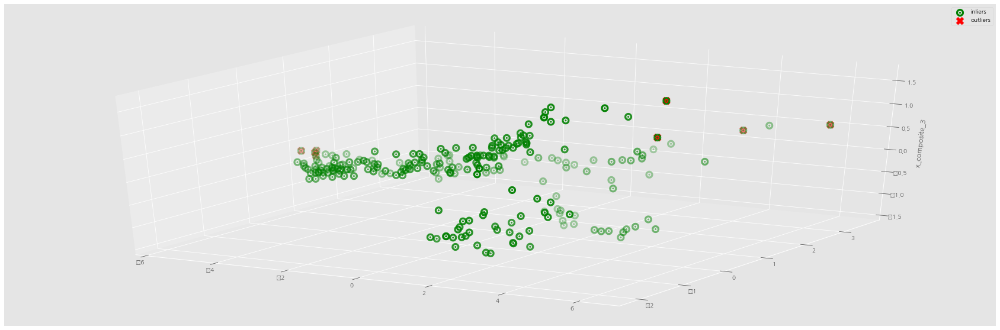

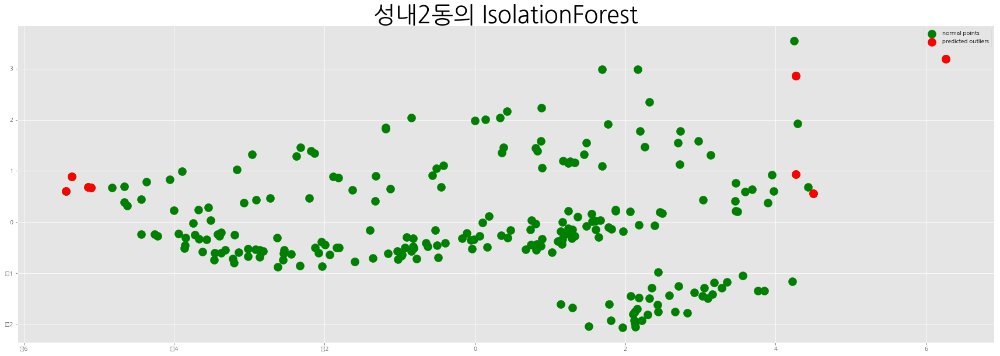

Counter({1: 233, -1: 8})


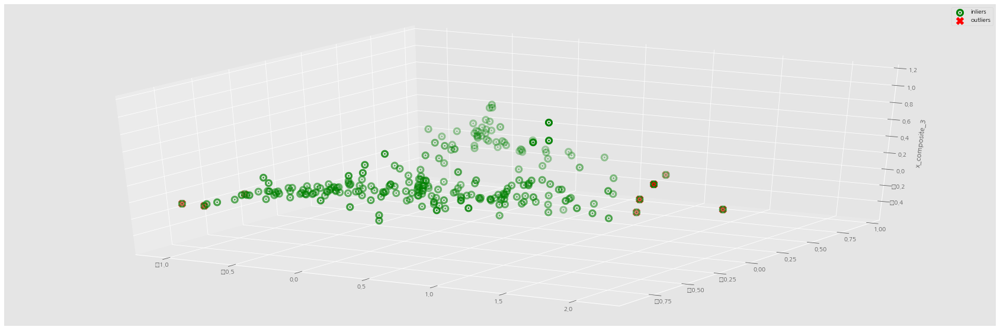

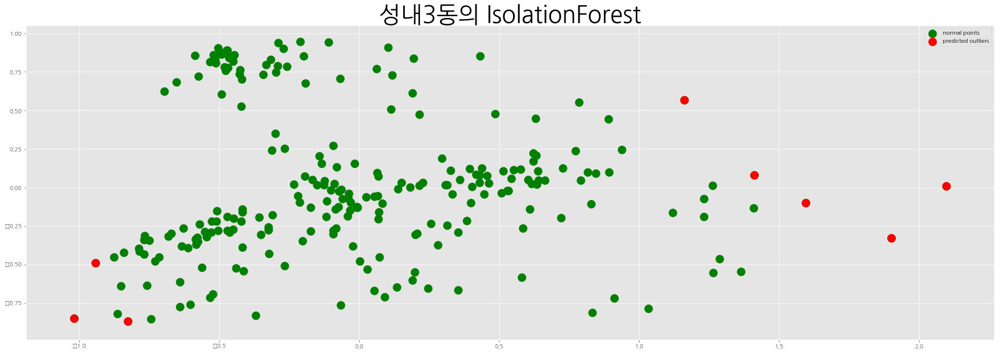

Counter({1: 233, -1: 8})


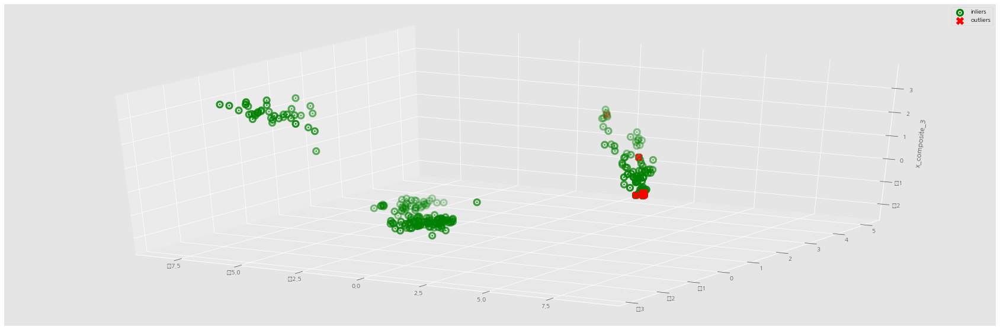

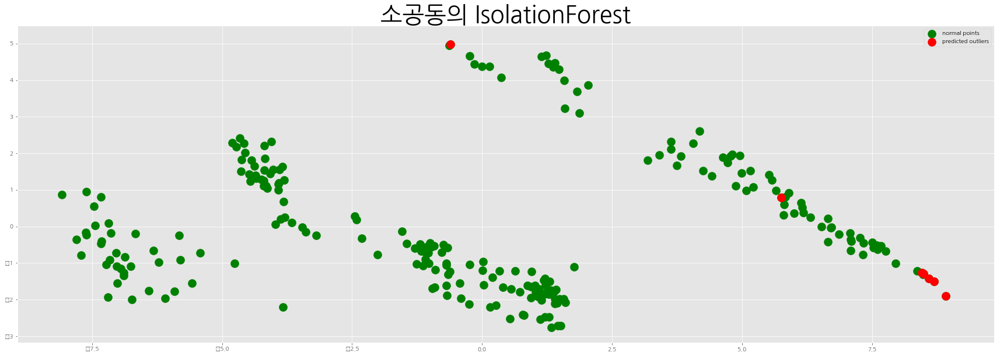

Counter({1: 233, -1: 8})


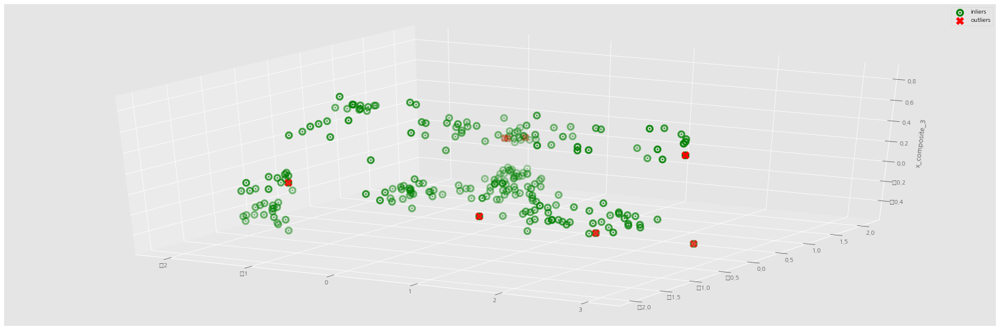

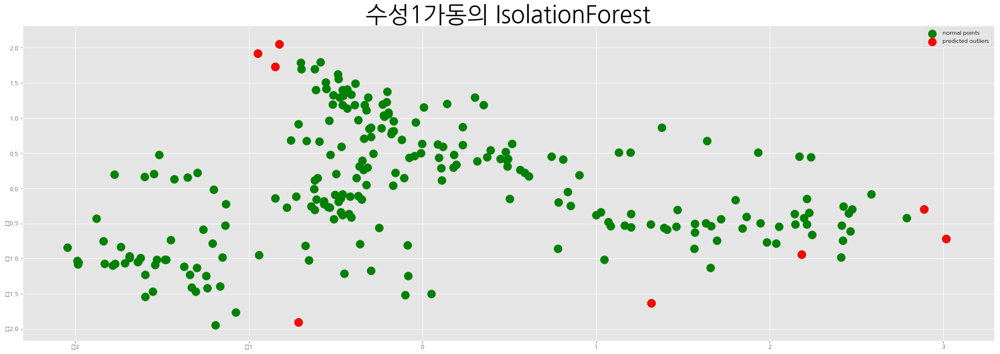

Counter({1: 233, -1: 8})


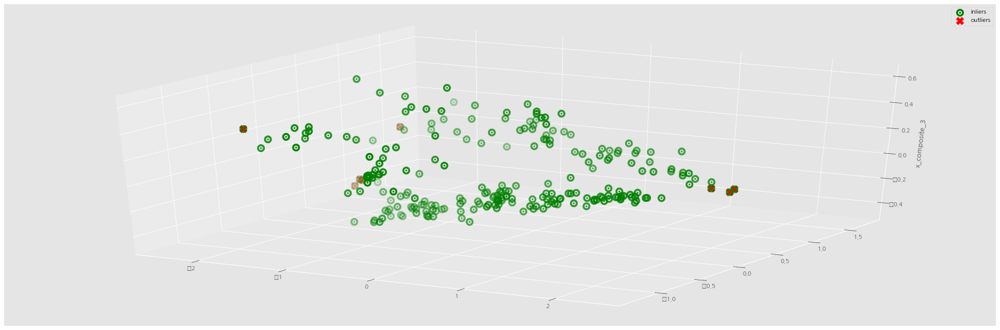

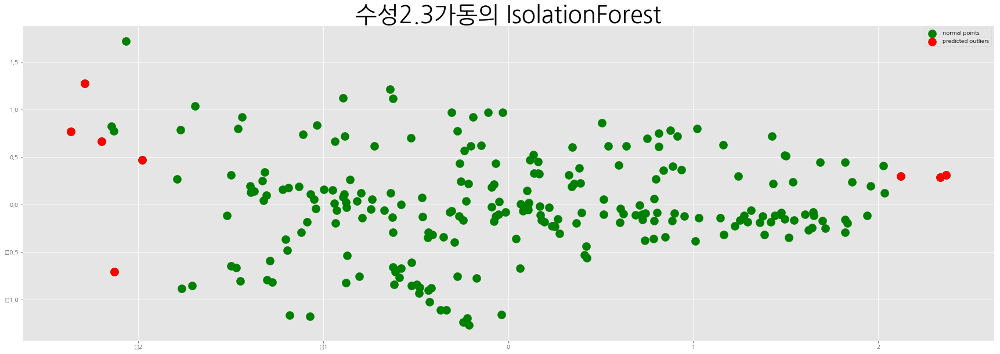

Counter({1: 233, -1: 8})


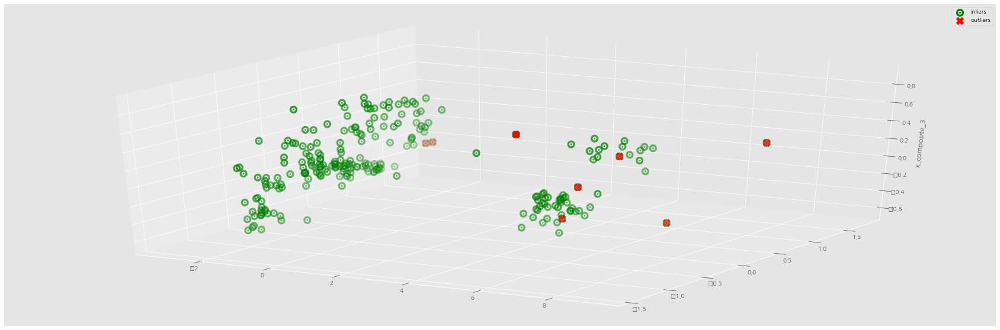

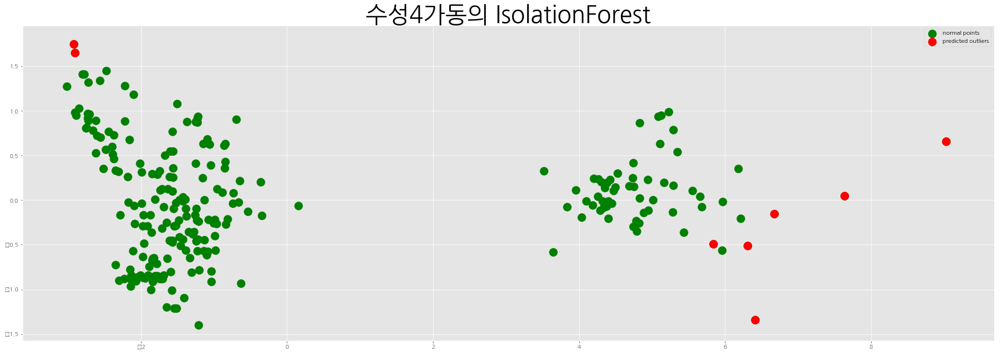

Counter({1: 233, -1: 8})


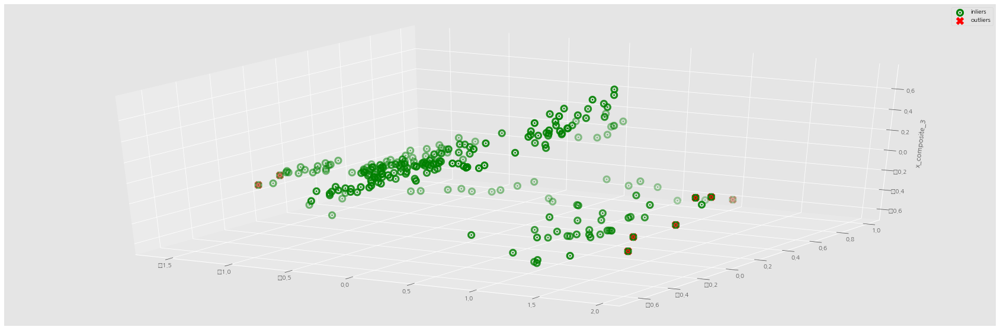

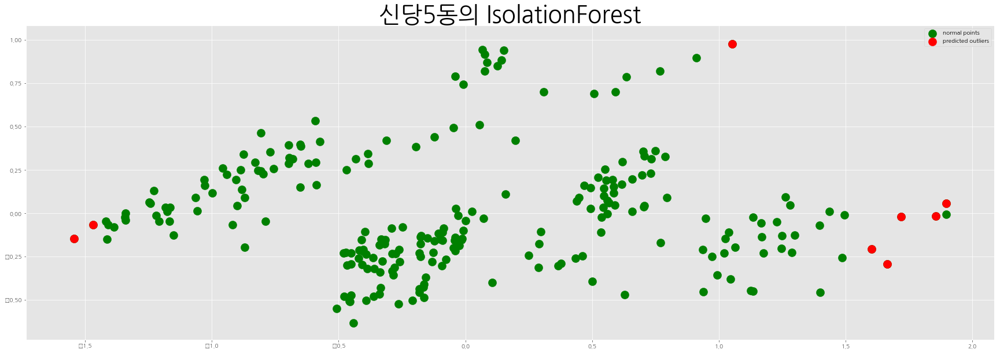

Counter({1: 233, -1: 8})


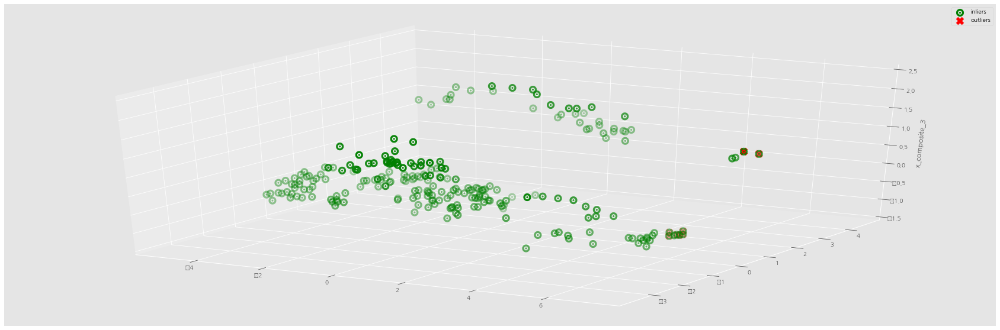

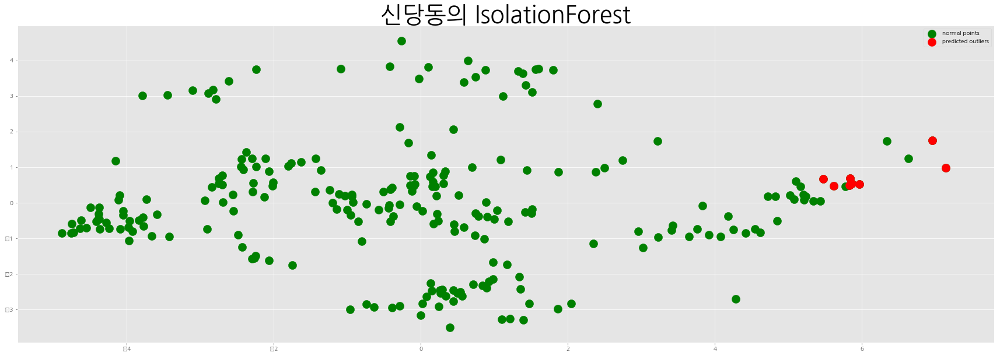

Counter({1: 233, -1: 8})


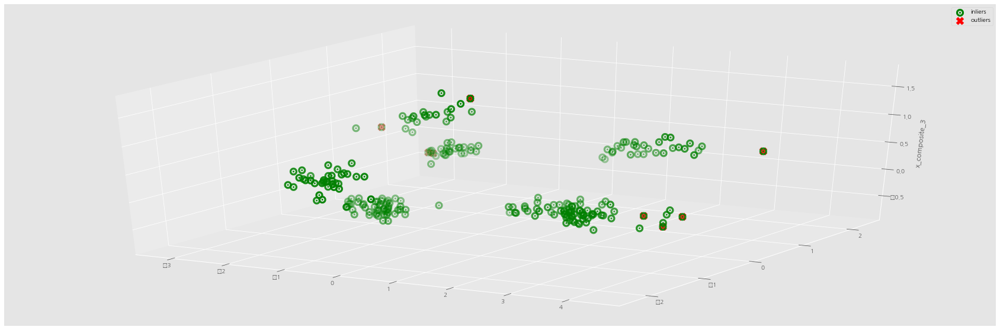

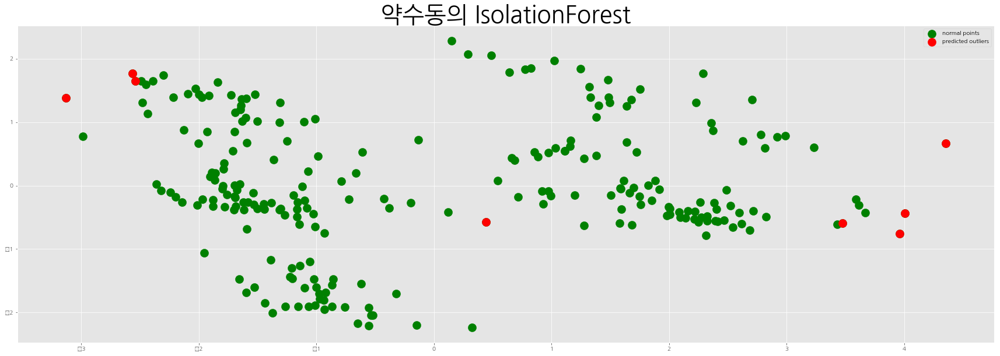

Counter({1: 233, -1: 8})


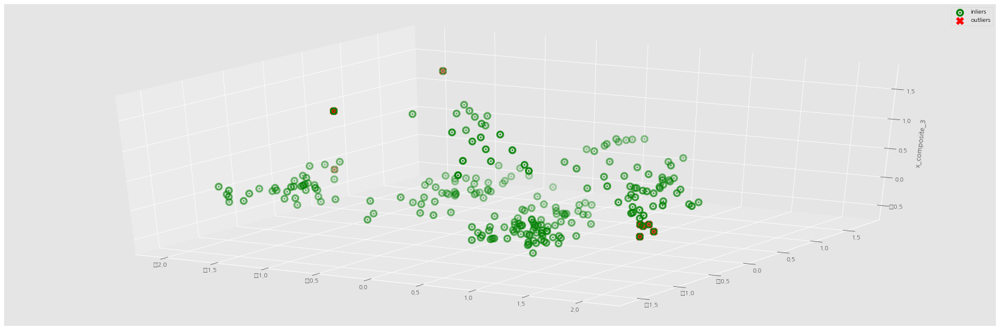

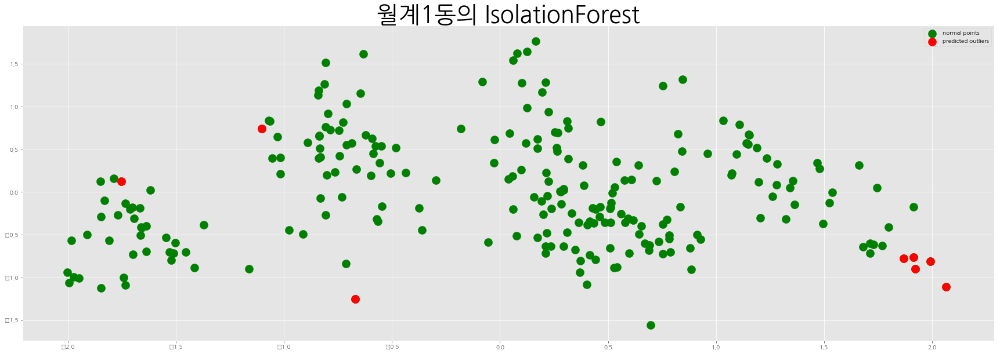

Counter({1: 233, -1: 8})


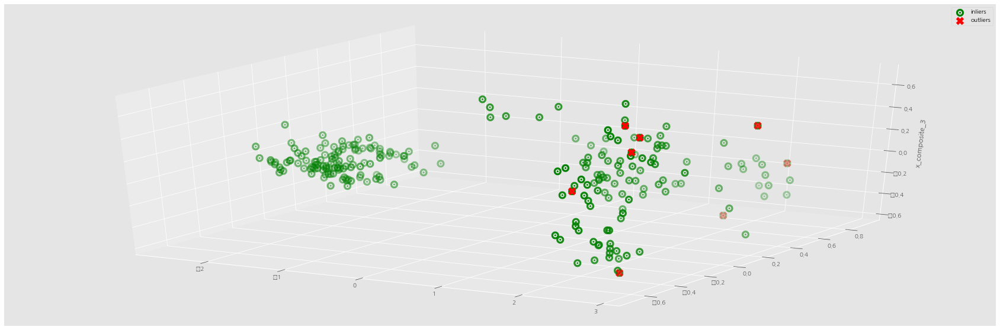

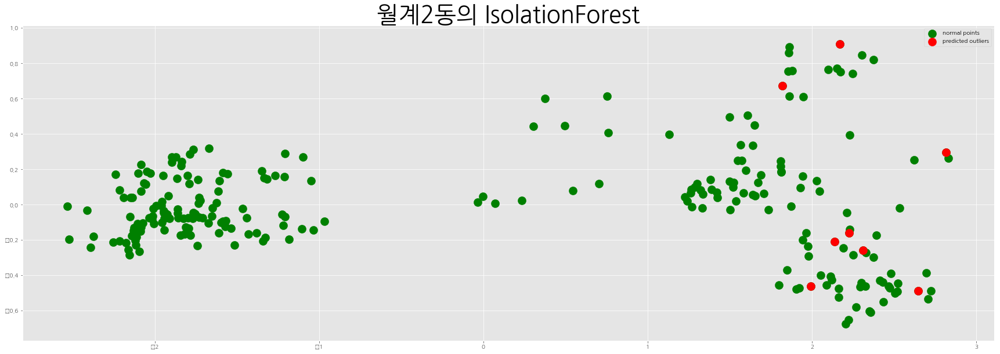

Counter({1: 233, -1: 8})


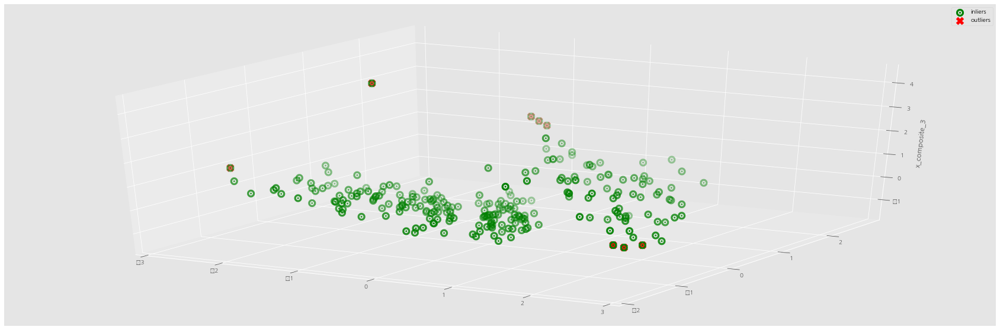

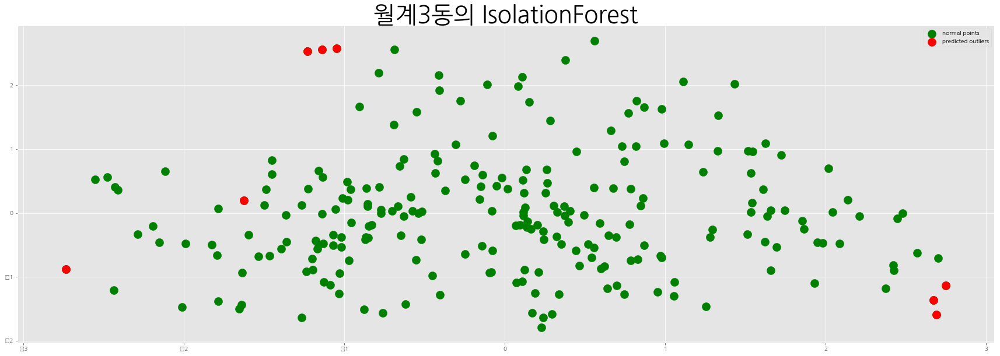

Counter({1: 233, -1: 8})


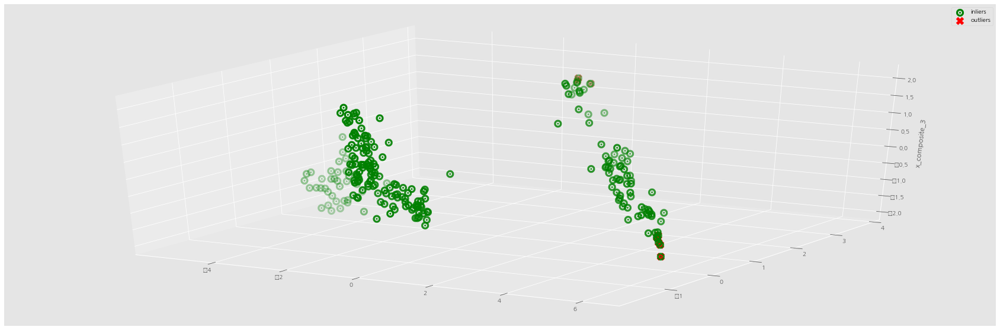

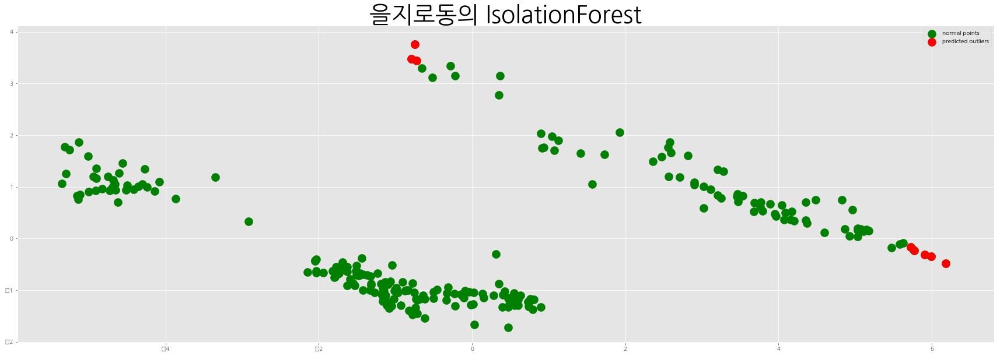

Counter({1: 233, -1: 8})


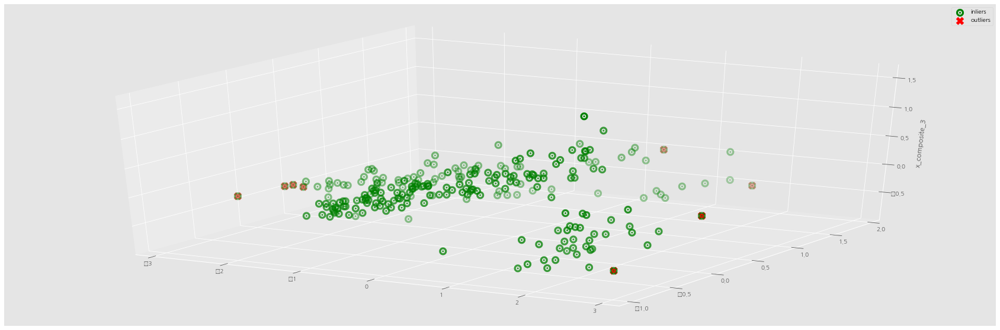

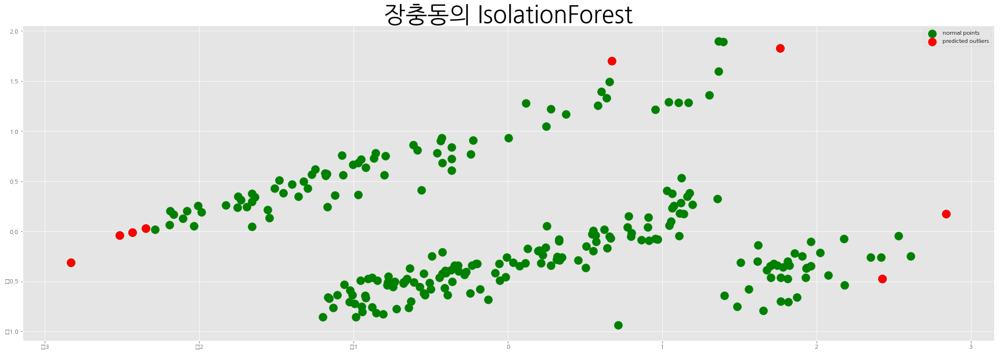

Counter({1: 233, -1: 8})


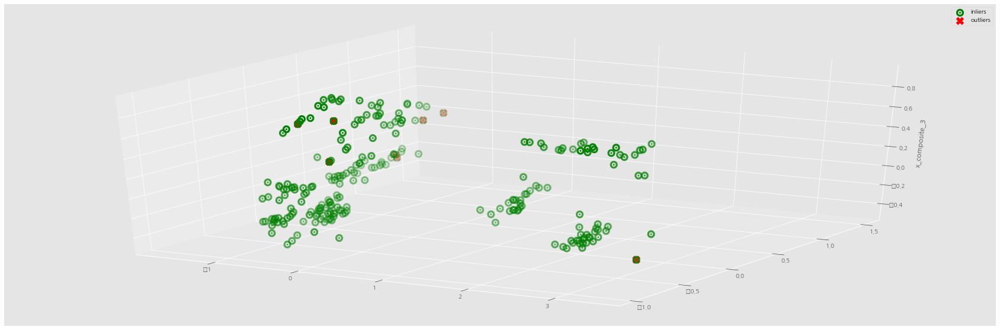

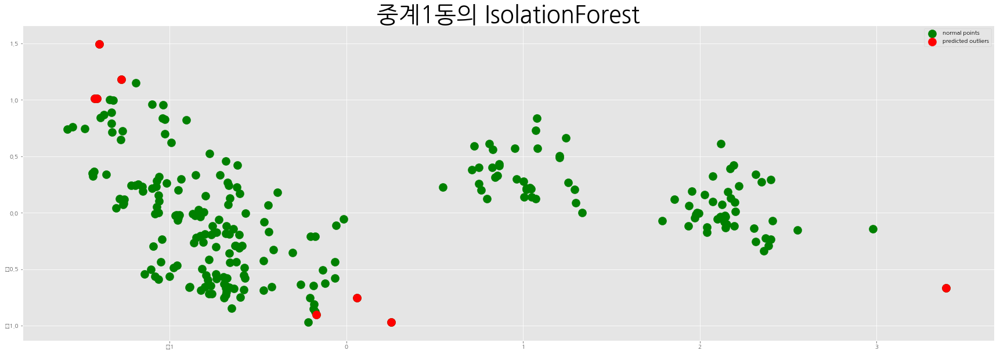

Counter({1: 233, -1: 8})


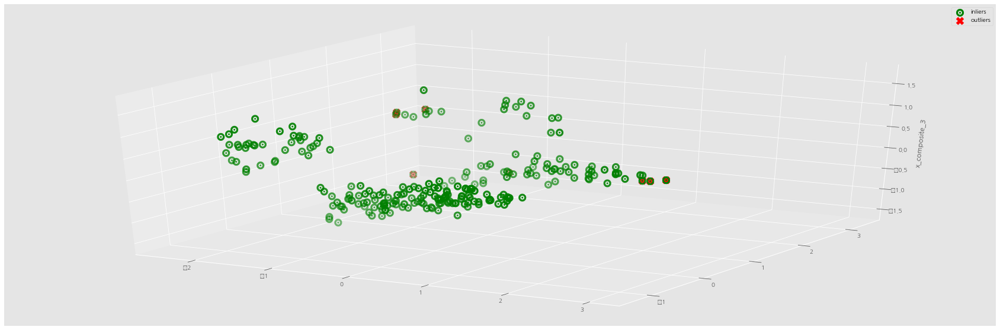

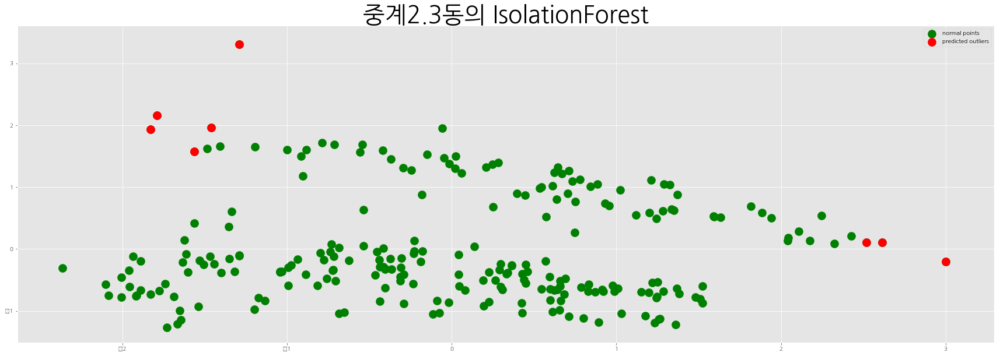

Counter({1: 233, -1: 8})


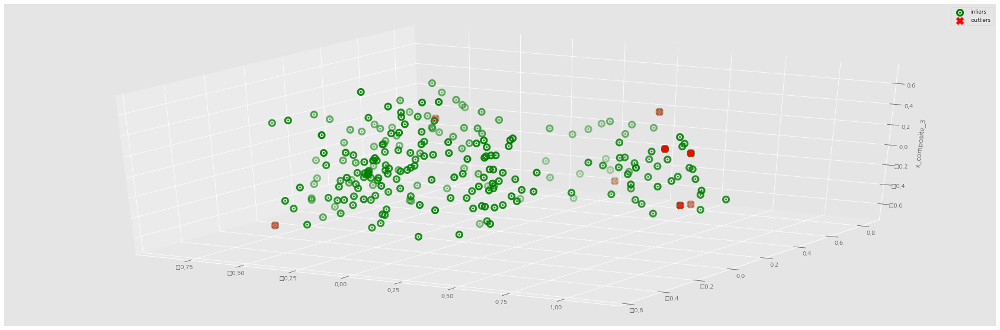

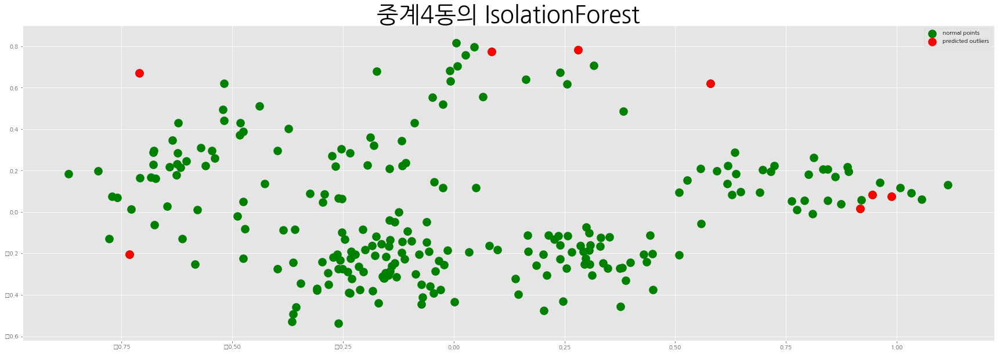

Counter({1: 233, -1: 8})


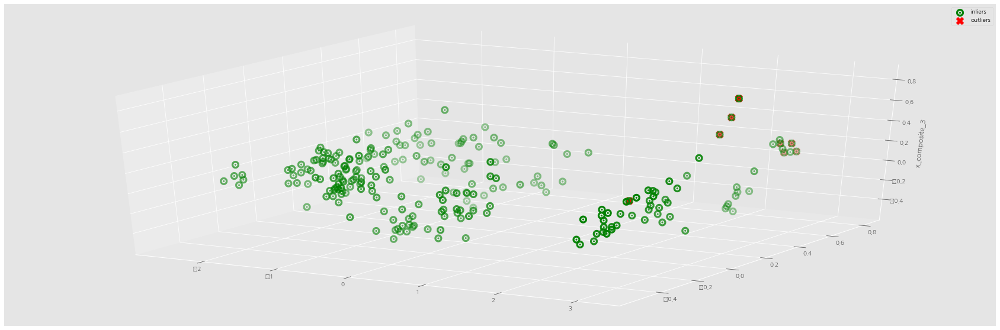

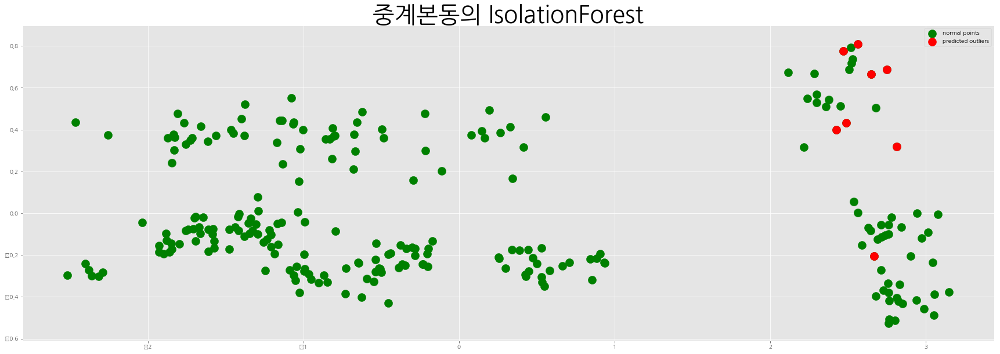

Counter({1: 233, -1: 8})


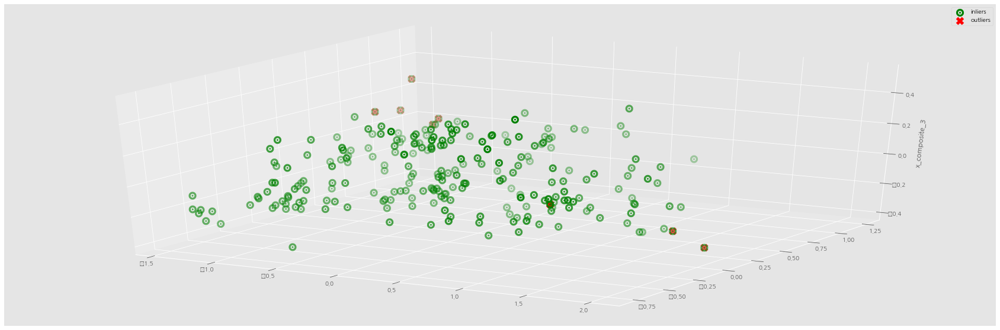

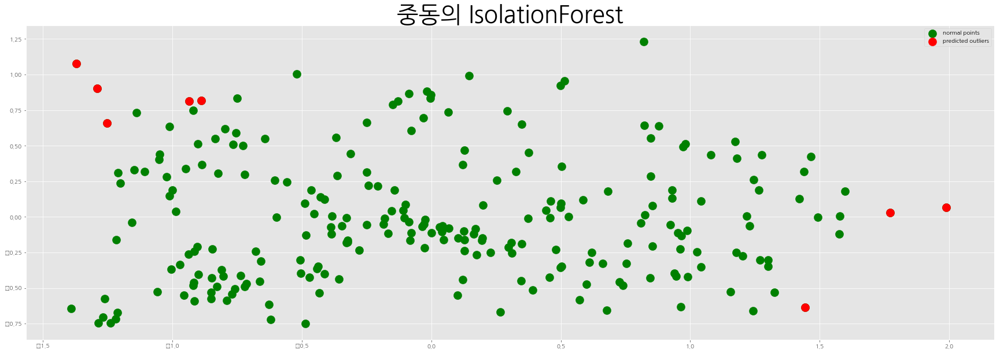

Counter({1: 233, -1: 8})


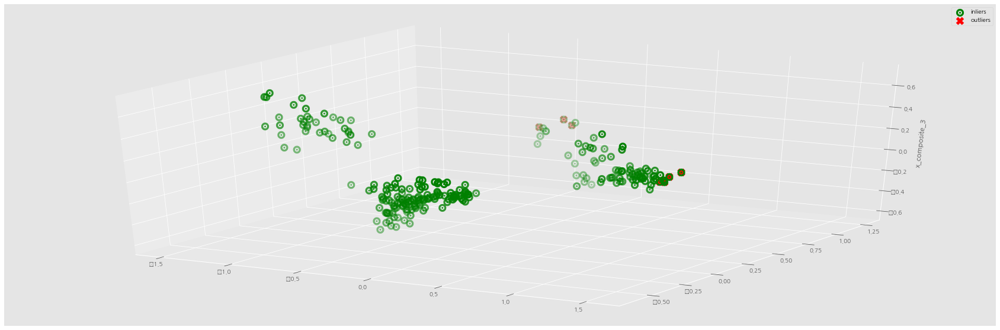

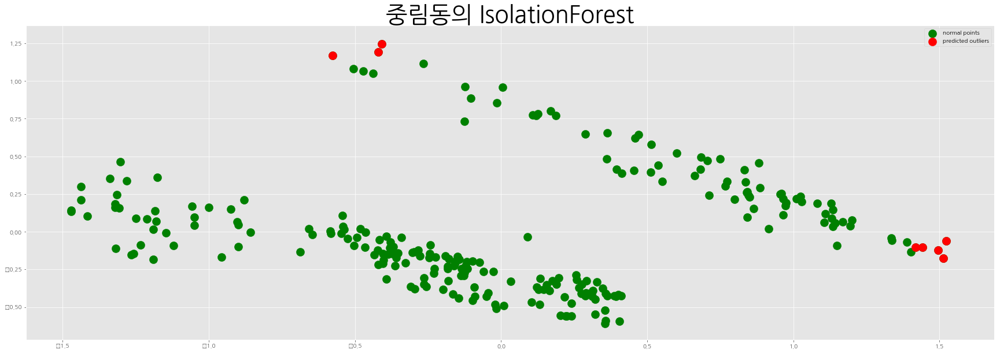

Counter({1: 233, -1: 8})


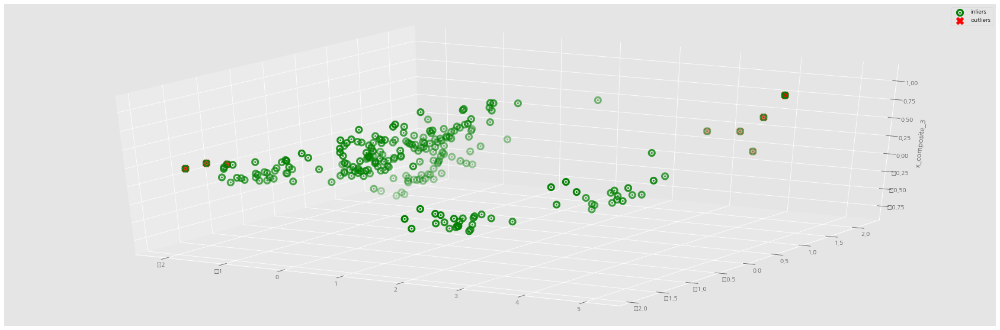

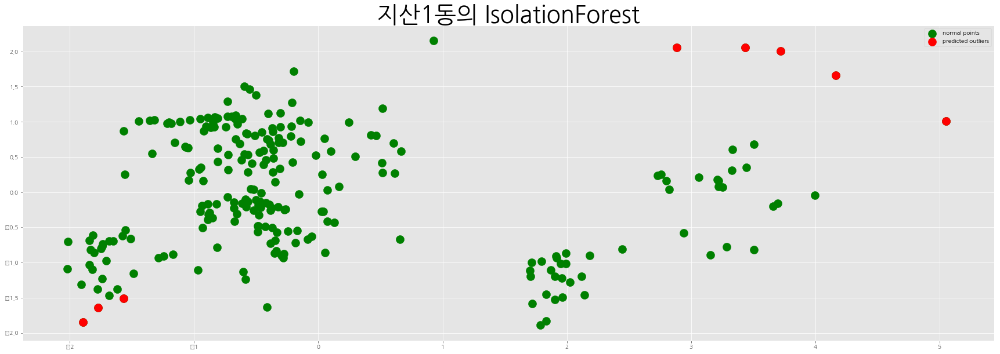

Counter({1: 233, -1: 8})


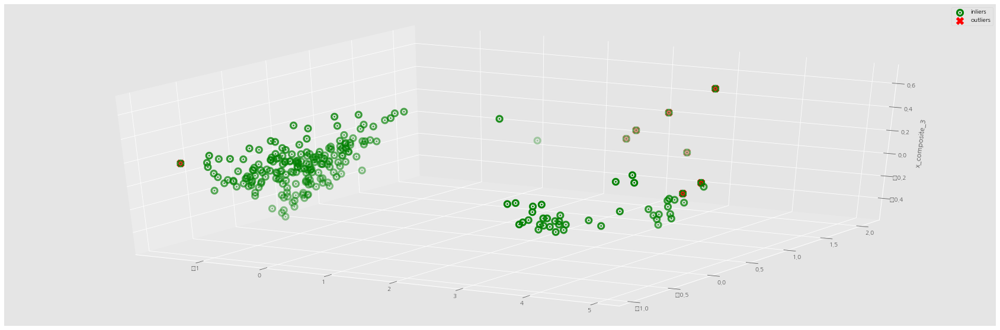

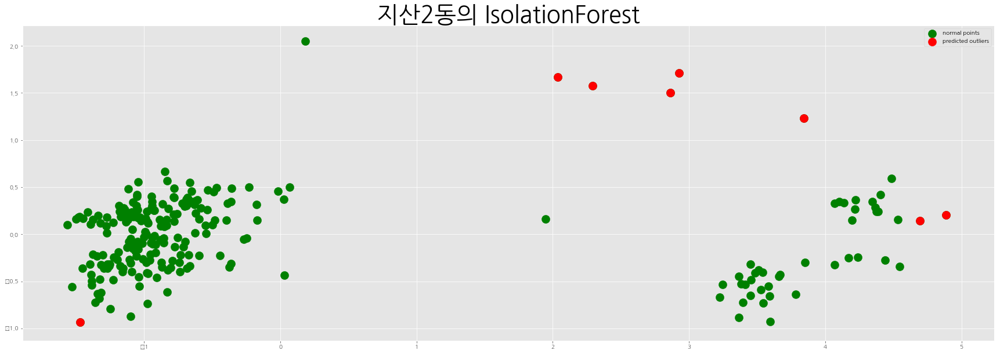

Counter({1: 233, -1: 8})


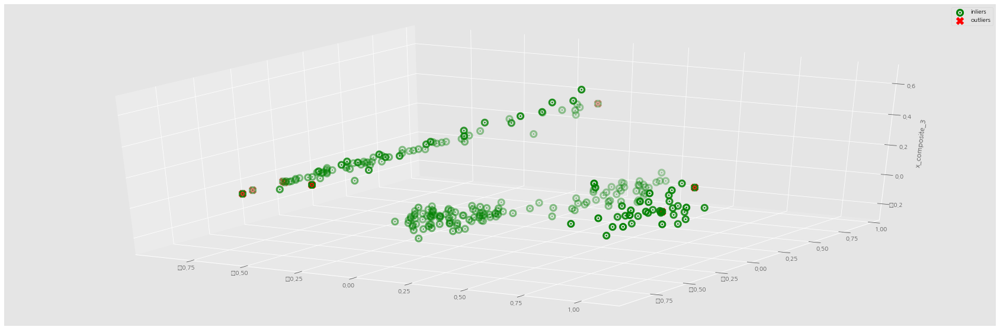

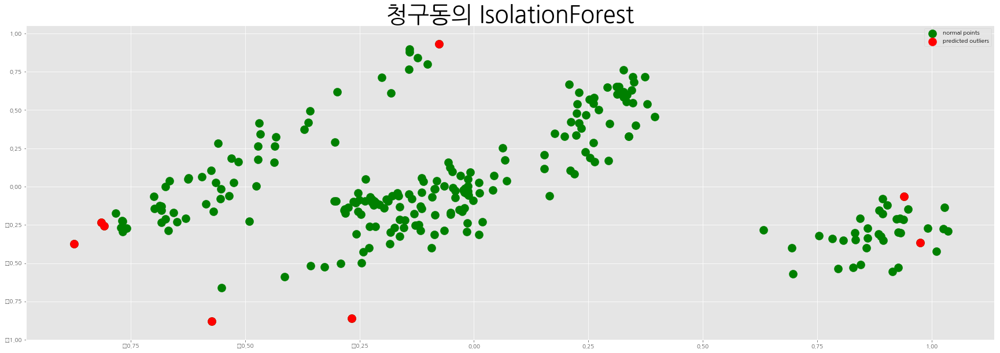

Counter({1: 233, -1: 8})


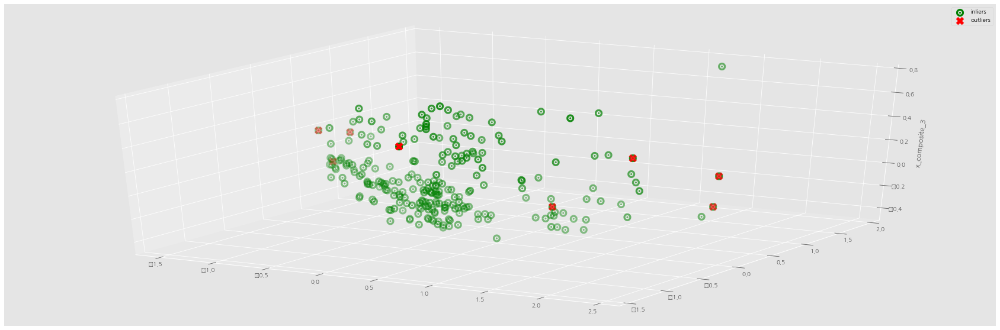

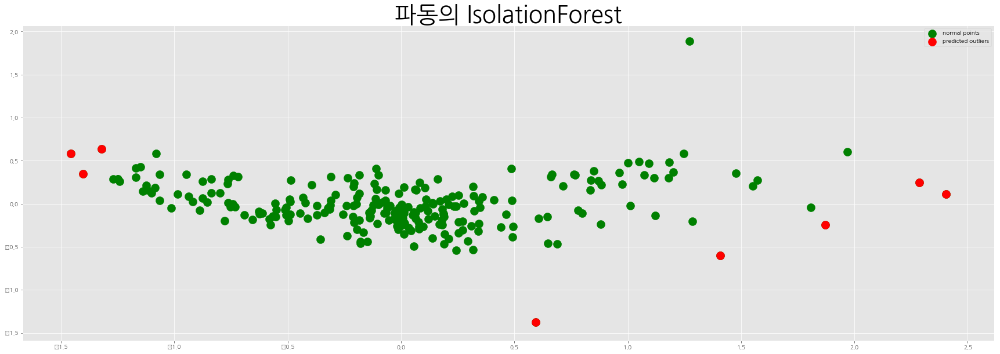

Counter({1: 233, -1: 8})


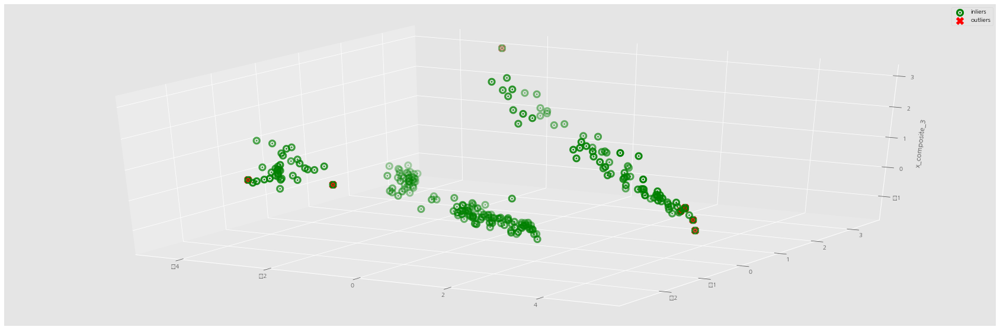

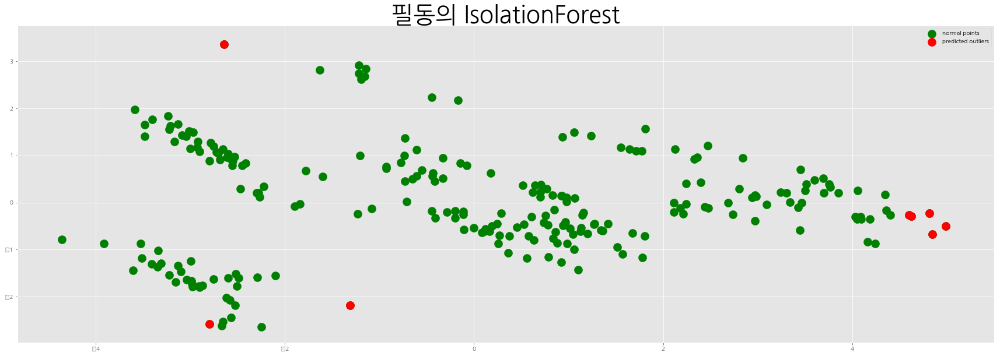

Counter({1: 233, -1: 8})


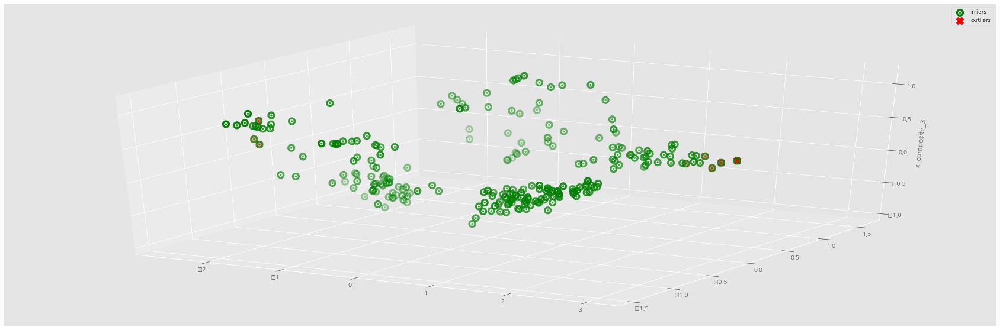

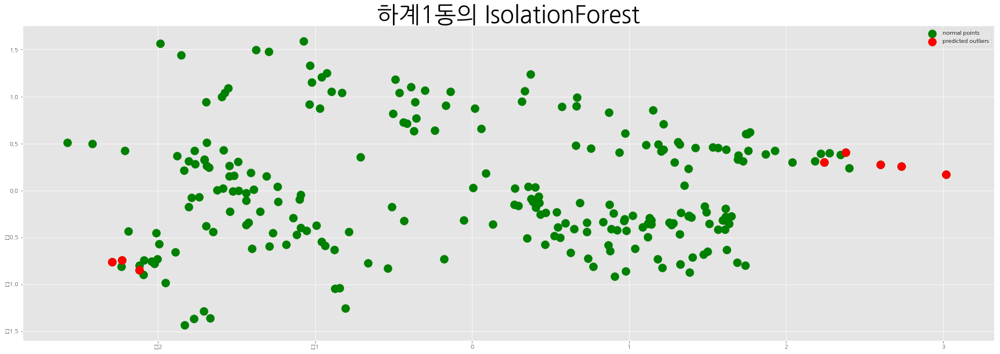

Counter({1: 233, -1: 8})


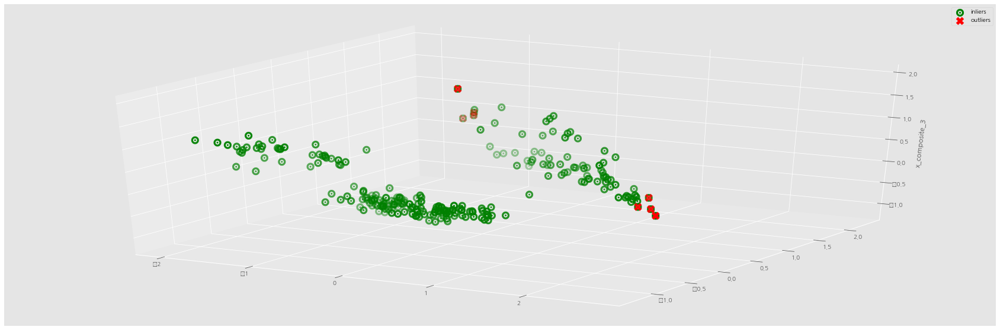

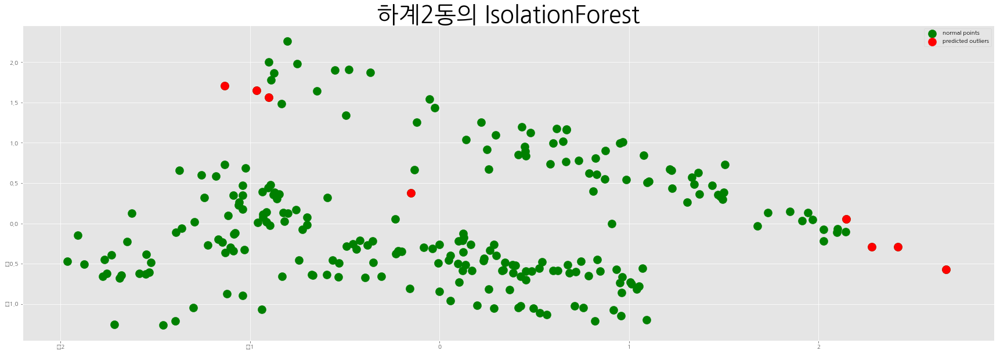

Counter({1: 233, -1: 8})


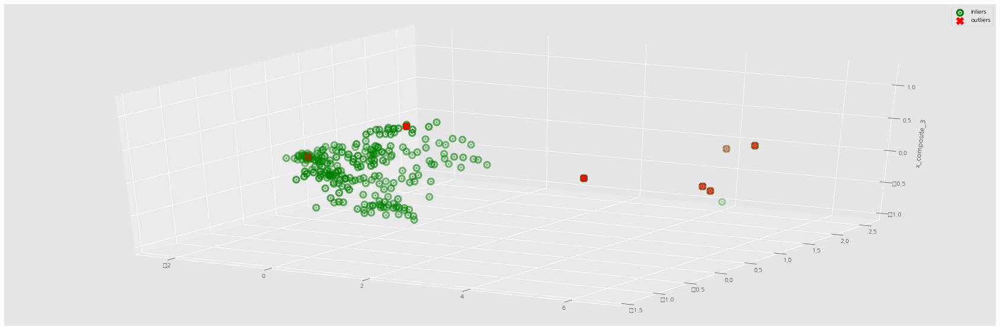

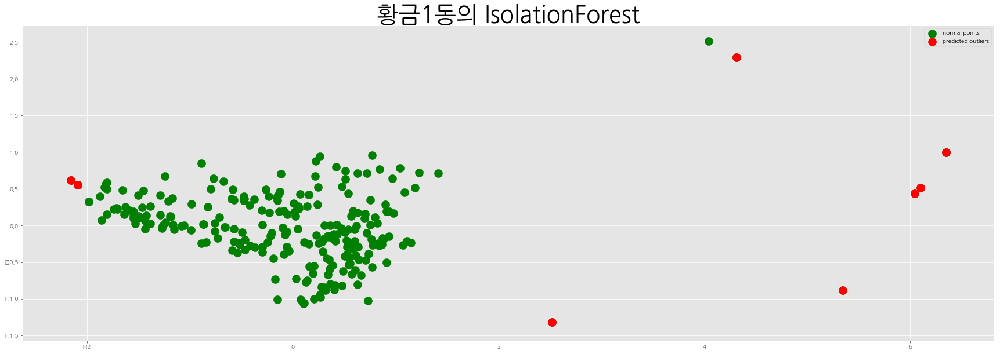

Counter({1: 233, -1: 8})


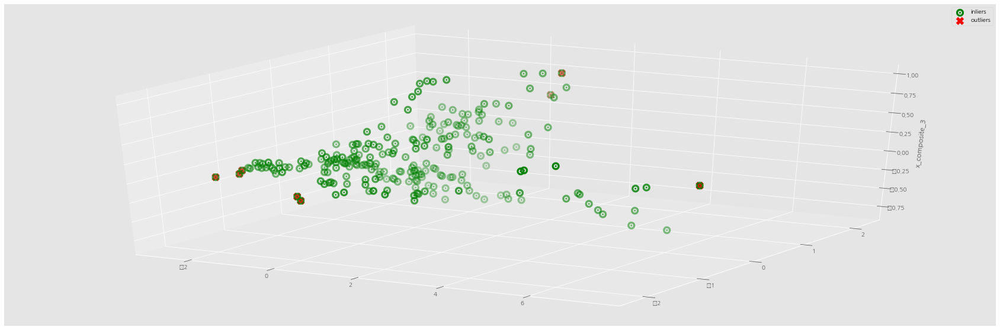

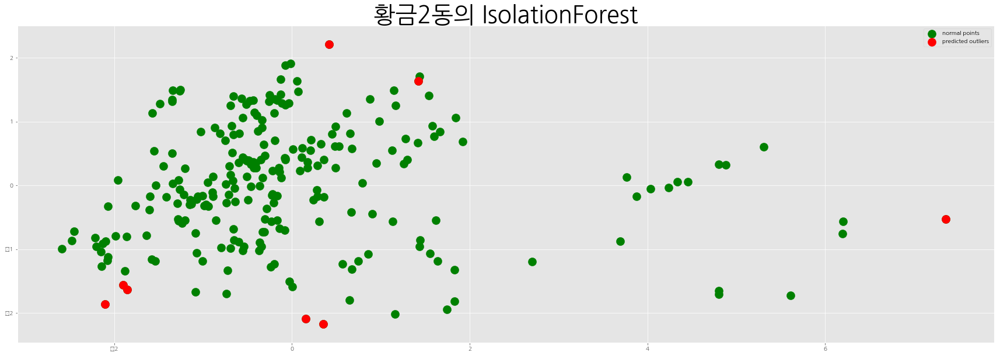

Counter({1: 233, -1: 8})


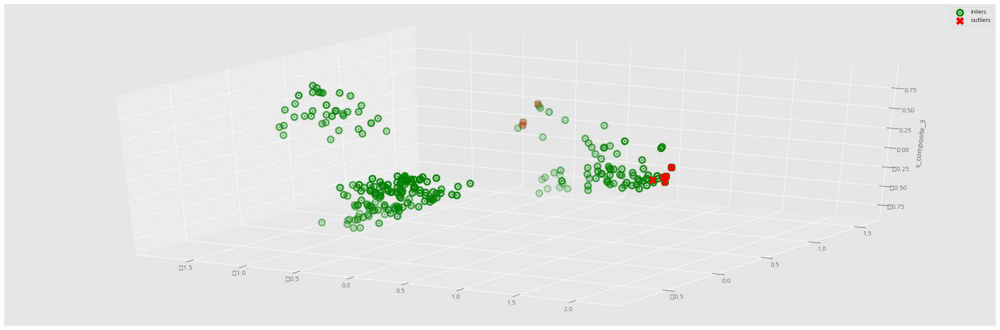

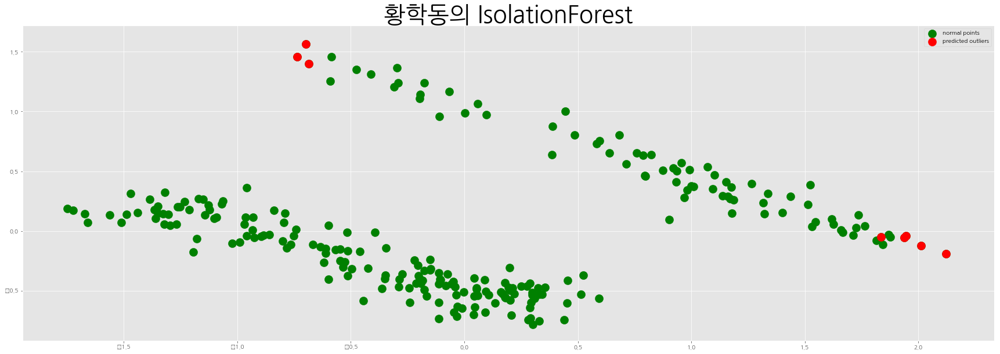

Counter({1: 233, -1: 8})


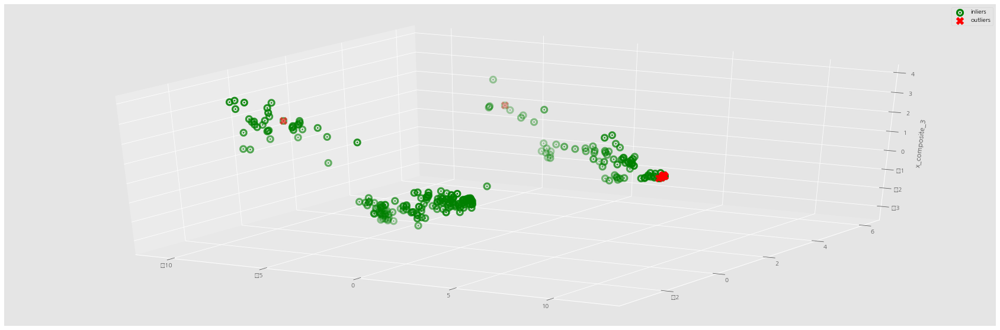

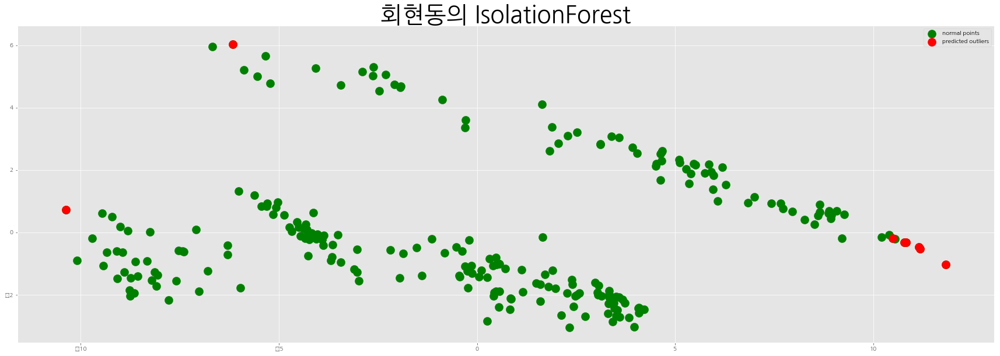

In [322]:
sk_TIME_Dong_scale = pd.DataFrame(columns =sk_data_TIME_Dong_scale.columns)

for dong in sk_dongs :
    sk_time_scale_data = sk_data_TIME_Dong[sk_data_TIME_Dong.HDONG_NM == dong]
    sk_time_scale_data_preserve = sk_time_scale_data.copy()
    sk_time_scale_data = sk_time_scale_data.iloc[:, 2:]
    
    # standard 정규화
    scaler_time = StandardScaler()
    scaler_time.fit(sk_time_scale_data)
    
    scaler_time_transform = scaler.transform(sk_time_scale_data)
    
    scale_time_scaled_standard = scaler_time.transform(sk_time_scale_data)
    scale_time_scaled_standard = pd.DataFrame(scale_time_scaled_standard)
    scale_time_scaled_standard.columns = sk_time_scale_data.columns
    scale_time_scaled_standard = scale_time_scaled_standard.fillna(0)
    
    # 이상치 제거
    clf_time = IsolationForest(
                    behaviour = 'new',
                    n_estimators=100,
                    max_samples="auto", 
                    contamination=0.03,
                    max_features=1,
                    bootstrap=False,
                    n_jobs=1,
                    random_state=None,
                    verbose=0)
    
    clf_time.fit(scale_time_scaled_standard)
    
    time_pred_outliers = clf_time.predict(scale_time_scaled_standard)
    print(collections.Counter(time_pred_outliers))
    
    scale_time_scaled_standard['out'] = time_pred_outliers
    
    scale_time_scaled_standard['STD_YMD'] = np.array(sk_time_scale_data_preserve.STD_YMD)
    scale_time_scaled_standard['HDONG_NM'] = np.array(sk_time_scale_data_preserve.HDONG_NM)
    
    sk_data_TIME_Dong_scale = scale_time_scaled_standard.copy()
    
    outliers=sk_data_TIME_Dong_scale[sk_data_TIME_Dong_scale.out == -1]
    outlier_index=list(outliers.index)
    
    sk_data_TIME_Dong_scale = sk_data_TIME_Dong_scale[sk_data_TIME_Dong_scale.out == 1]
    
    del sk_data_TIME_Dong_scale['out']
    
    # 3차원 PCA plot 그리기
    pca = PCA(n_components=3)
    X_scaled_reduce = pca.fit_transform(scaler_time_transform)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection = '3d')
    ax.set_zlabel("x_composite_3")
    
    ax.scatter(X_scaled_reduce[:, 0], X_scaled_reduce[:, 1], zs=X_scaled_reduce[:, 2], s=10, lw=10, label="inliers",c="green")
    # Plot x's for the ground truth outliers
    ax.scatter(X_scaled_reduce[outlier_index,0],X_scaled_reduce[outlier_index,1], 
               X_scaled_reduce[outlier_index,2],
               lw=5, s=100, marker="x", c="red", label="outliers")
    ax.legend()
    plt.show()
    
    # 2차원 PCA plot 그리기
    pca = PCA(2)
    pca.fit(scaler_time_transform)
    res=pd.DataFrame(pca.transform(scaler_time_transform))
    Z = np.array(res)
    
    plt.title(f"{dong}의 IsolationForest", fontsize=40)
    b1 = plt.scatter(res[0], res[1], c='green',
                     s=200,label="normal points")
    b1 =plt.scatter(res.iloc[outlier_index,0],res.iloc[outlier_index,1], c='red',s=200,  edgecolor="red",label="predicted outliers")
    plt.legend(loc="upper right")
    plt.show()
    
    # 전체 데이터
    sk_TIME_Dong_scale = pd.concat([sk_TIME_Dong_scale, sk_data_TIME_Dong_scale], axis = 0)    
    
    
    

In [283]:
sk_TIME_Dong_scale

,TMST_00,TMST_01,TMST_02,TMST_03,TMST_04,TMST_05,TMST_06,TMST_07,TMST_08,TMST_09,...,TMST_16,TMST_17,TMST_18,TMST_19,TMST_20,TMST_21,TMST_22,TMST_23,STD_YMD,HDONG_NM
0,-1.204427,-1.168832,-1.198357,-1.038036,-0.972386,-0.087257,-0.044107,0.490655,0.115348,1.992164,...,-1.505079,1.286733,1.555165,0.253565,0.426357,0.221909,0.170101,-0.228637,20190201,고산1동
1,-0.141304,-0.246328,-0.376126,-0.457625,-0.757545,-0.516915,-1.134566,-0.874798,-0.509830,1.184642,...,1.658902,1.104113,-0.165887,-0.419218,-0.201429,-0.020115,-0.267622,-0.215712,20190202,고산1동
2,-0.088462,-0.248285,-0.249108,-0.671737,-0.756924,-1.365455,-2.015296,-1.325892,-1.523905,-1.103709,...,0.887308,0.148076,-0.951707,-1.076619,-0.622726,-0.420402,-0.626316,-0.623769,20190203,고산1동
3,-0.531605,-0.295343,-0.304385,-0.274211,-0.649365,-1.323464,-1.917545,-1.267684,-1.388469,-0.204426,...,-0.007539,-0.999100,-1.493186,-1.203175,-0.747215,-0.885944,-1.161231,-1.201777,20190204,고산1동
4,-1.325453,-1.083142,-1.160805,-1.322779,-1.214271,-0.710392,-0.048132,1.277598,0.764377,-0.606423,...,1.609162,-0.030578,-1.217766,-0.834974,0.370657,0.359298,-0.138172,-0.371059,20190205,고산1동
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,-0.236623,0.084594,0.033957,0.174223,-0.316440,-0.233400,-0.065605,0.180616,0.411313,0.659331,...,-0.041956,0.101534,0.374798,0.108350,-0.389499,-0.126077,0.000347,0.246471,20200527,회현동
237,0.039855,0.289741,0.151634,0.369909,-0.290644,-0.131900,0.015751,0.189210,0.475186,0.448256,...,-0.162976,-0.068284,0.008341,0.089088,-0.434438,-0.315455,0.003278,0.157036,20200528,회현동
238,0.103379,0.742068,0.463187,0.957935,-0.207399,-0.262421,-0.149955,0.144586,0.334323,0.428177,...,0.114989,-0.027289,0.460838,0.408484,0.120309,-0.044611,0.185025,0.975485,20200529,회현동
239,1.218510,1.230542,1.517964,0.867859,-0.286472,-0.659726,-0.706530,-1.028218,-1.309289,-1.121328,...,-0.221327,-0.737458,-1.264541,-1.361315,-0.742129,-0.730931,-0.680187,-0.510575,20200530,회현동


In [239]:
from sklearn.preprocessing import StandardScaler

sk_time_scale_data = sk_data_TIME_Dong.iloc[:, 2:]
sk_age_scale_data = sk_data_AGE_Dong.iloc[:, 2:]

scaler_time = StandardScaler()
scaler_age = StandardScaler()

scaler_time.fit(sk_time_scale_data)
scale_time_scaled_standard = scaler_time.transform(sk_time_scale_data)
scale_time_scaled_standard = pd.DataFrame(scale_time_scaled_standard)
scale_time_scaled_standard.columns = sk_time_scale_data.columns

scaler_age.fit(sk_age_scale_data)
scale_age_scaled_standard = scaler_age.transform(sk_age_scale_data)
scale_age_scaled_standard = pd.DataFrame(scale_age_scaled_standard)
scale_age_scaled_standard.columns = sk_age_scale_data.columns

In [240]:
scale_time_scaled_standard = scale_time_scaled_standard.fillna(0)
scale_age_scaled_standard = scale_age_scaled_standard.fillna(0)

In [241]:
from sklearn.ensemble import IsolationForest
import collections

clf_time = IsolationForest(n_estimators=100,
                      max_samples="auto", 
                      contamination=0.1,
                      max_features=1,
                      bootstrap=False,
                      n_jobs=1,
                      random_state=None,
                      verbose=0)

clf_age = IsolationForest(n_estimators=100,
                      max_samples="auto", 
                      contamination=0.1,
                      max_features=1,
                      bootstrap=False,
                      n_jobs=1,
                      random_state=None,
                      verbose=0)

In [242]:
clf_time.fit(scale_time_scaled_standard)
clf_age.fit(scale_age_scaled_standard)

IsolationForest(behaviour='old', bootstrap=False, contamination=0.1,
                max_features=1, max_samples='auto', n_estimators=100, n_jobs=1,
                random_state=None, verbose=0, warm_start=False)

In [243]:
time_pred_outliers = clf_time.predict(scale_time_scaled_standard)
age_pred_outliers = clf_age.predict(scale_age_scaled_standard)

/Users/minki/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)
/Users/minki/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)


In [244]:
print(collections.Counter(time_pred_outliers))
print(collections.Counter(age_pred_outliers))

Counter({1: 14966, -1: 1663})
Counter({1: 14966, -1: 1663})


time 데이터와 age 데이터 모두 이상치의 개수가 1663개로 같음

In [245]:
scale_time_scaled_standard['out'] = time_pred_outliers
scale_age_scaled_standard['out'] = age_pred_outliers

In [246]:
scale_time_scaled_standard['STD_YMD'] = np.array(sk_data_TIME_Dong.STD_YMD)
scale_time_scaled_standard['HDONG_NM'] = np.array(sk_data_TIME_Dong.HDONG_NM)

scale_age_scaled_standard['STD_YMD'] = np.array(sk_data_AGE_Dong.STD_YMD)
scale_age_scaled_standard['HDONG_NM'] = np.array(sk_data_AGE_Dong.HDONG_NM)

In [247]:
sk_data_TIME_Dong_scale = scale_time_scaled_standard.copy()
sk_data_AGE_Dong_scale = scale_age_scaled_standard.copy()

In [248]:
TIME_outlier = sk_data_TIME_Dong_scale[sk_data_TIME_Dong_scale.out == -1]
AGE_outlier = sk_data_AGE_Dong_scale[sk_data_AGE_Dong_scale.out == -1]

In [253]:
TIME_outlier_index = list(TIME_outlier.index)
AGE_outlier_index = list(AGE_outlier.index)

In [267]:
# sk_data_TIME_Dong.iloc[TIME_outlier_index]

In [212]:
sk_data_TIME_Dong_scale = sk_data_TIME_Dong_scale[sk_data_TIME_Dong_scale.out == 1]
sk_data_AGE_Dong_scale = sk_data_AGE_Dong_scale[sk_data_AGE_Dong_scale.out == 1]

In [214]:
del sk_data_TIME_Dong_scale['out']
del sk_data_AGE_Dong_scale['out']

In [227]:
sk_data_TIME_Dong_scale

,TMST_00,TMST_01,TMST_02,TMST_03,TMST_04,TMST_05,TMST_06,TMST_07,TMST_08,TMST_09,...,TMST_16,TMST_17,TMST_18,TMST_19,TMST_20,TMST_21,TMST_22,TMST_23,STD_YMD,HDONG_NM
0,0.196491,0.104483,-0.096634,0.007994,0.022699,0.388598,0.364547,0.348285,0.100915,0.773024,...,0.456623,1.422282,1.487715,1.207135,1.397722,1.259110,1.175187,0.920157,20190201,고산1동
1,1.107527,1.035036,0.757233,0.545642,0.171106,0.242839,0.004425,-0.150904,-0.049423,0.587237,...,1.469769,1.362769,0.871152,0.907546,1.101678,1.137375,0.918120,0.928781,20190202,고산1동
2,1.152811,1.033063,0.889138,0.347306,0.171536,-0.045024,-0.286435,-0.315817,-0.293280,0.060754,...,1.222695,1.051208,0.589633,0.614807,0.903007,0.936037,0.707465,0.656505,20190203,고산1동
3,0.773062,0.985594,0.831734,0.715542,0.245835,-0.030779,-0.254153,-0.294537,-0.260711,0.267653,...,0.936154,0.677356,0.395650,0.558451,0.844302,0.701876,0.393320,0.270829,20190204,고산1동
4,0.092779,0.190921,-0.057637,-0.255770,-0.144390,0.177203,0.363218,0.635979,0.256988,0.175165,...,1.453841,0.992986,0.494319,0.722411,1.371456,1.328214,0.994143,0.825126,20190205,고산1동
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16615,0.155477,-0.169155,-0.371451,-0.352588,0.391569,2.256479,2.863777,2.554339,3.359601,3.380562,...,1.804053,1.599031,2.166200,1.583150,1.026534,0.910113,1.192429,0.810874,20200518,회현동
16620,1.372620,0.967495,0.622547,0.554684,0.416288,1.562720,1.192865,0.285920,0.307598,1.408392,...,2.157144,1.523775,0.642689,0.626372,1.120226,0.944753,1.335125,1.387237,20200523,회현동
16621,0.507099,0.147095,-0.015583,-0.172284,-0.317610,0.094567,0.064559,-0.318731,-0.296229,0.059315,...,0.798692,0.628383,0.247595,0.324646,0.905252,0.837501,0.757107,0.524503,20200524,회현동
16627,1.437004,0.877225,0.804411,0.450751,0.622244,1.374588,1.436625,0.374798,0.313722,1.333454,...,2.340993,1.509570,0.617100,0.515151,1.095076,1.147821,1.183032,1.075235,20200530,회현동


# 2. cj 데이터 전처리

In [215]:
cj_shop_sub = cj_shop[['DL_YMD', 'DL_GD_LCLS_CD', 'HDNG_NM', 'INVC_CONT']]

cj_shop_Dong = cj_shop_sub.groupby(['HDNG_NM', 'DL_YMD', 'DL_GD_LCLS_CD']).sum()

cj_shop_Dong.reset_index(level=['DL_GD_LCLS_CD'], inplace = True)
cj_shop_Dong.reset_index(level=['HDNG_NM'], inplace = True)
cj_shop_Dong.reset_index(level=['DL_YMD'], inplace = True)

cj_shop_Dong = cj_shop_Dong.rename(columns = {'HDNG_NM' : 'HDONG_NM'})

cj_shop_Dong.DL_YMD = cj_shop_Dong.DL_YMD.map(lambda x : '20' + str(x))

cj_shop_Dong = cj_shop_Dong.rename(columns = {'DL_YMD' : 'STD_YMD'})

cj_shop_Dong['idx'] = cj_shop_Dong.STD_YMD + cj_shop_Dong.HDONG_NM

cj_shop_Dong = cj_shop_Dong.pivot(index = 'idx', columns = 'DL_GD_LCLS_CD', values = 'INVC_CONT')
cj_shop_Dong = cj_shop_Dong.fillna(0)

cj_shop_Dong['HDONG_NM'] = cj_shop_Dong.index.map(lambda x : x[8:])

cj_shop_Dong['STD_YMD'] = cj_shop_Dong.index.map(lambda x : x[:8])

cj_shop_Dong = cj_shop_Dong[['STD_YMD', 'HDONG_NM', 10, 12, 13, 15, 16, 17, 18, 19, 20, 21]]

cj_shop_Dong.columns = ['STD_YMD', 'HDONG_NM', '가구/인테리어', '도서/음반', '디지털/가전', 
                        '생활건강', '스포츠/레저', '식품', '출산/육아', '패션의류', 
                        '패션잡화', '화장품/미용']

cj_shop_Dong = cj_shop_Dong.reset_index()
del cj_shop_Dong['idx']

In [216]:
cj_dong = list(dict(Counter(cj_shop_Dong.HDONG_NM)).keys())

# 2-2. cj 데이터 이상치 제거

In [218]:
cj_scale_data = cj_shop_Dong.iloc[:, 2:]

scaler_cj = StandardScaler()

scaler_cj.fit(cj_scale_data)
cj_scaled_standard = scaler_cj.transform(cj_scale_data)
cj_scaled_standard = pd.DataFrame(cj_scaled_standard)
cj_scaled_standard.columns = cj_scale_data.columns

In [220]:
cj_scaled_standard = cj_scaled_standard.fillna(0)

In [221]:
clf_cj = IsolationForest(n_estimators=100,
                      max_samples="auto", 
                      contamination=0.1,
                      max_features=1,
                      bootstrap=False,
                      n_jobs=1,
                      random_state=None,
                      verbose=0)

In [222]:
clf_cj.fit(cj_scaled_standard)

IsolationForest(behaviour='old', bootstrap=False, contamination=0.1,
                max_features=1, max_samples='auto', n_estimators=100, n_jobs=1,
                random_state=None, verbose=0, warm_start=False)

In [223]:
cj_pred_outliers = clf_cj.predict(cj_scaled_standard)

/Users/minki/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)


In [224]:
print(collections.Counter(cj_pred_outliers))

Counter({1: 14912, -1: 1657})


cj데이터의 이상치 개수는 1657개임

In [225]:
cj_scaled_standard['out'] = cj_pred_outliers

cj_scaled_standard['STD_YMD'] = np.array(cj_shop_Dong.STD_YMD)
cj_scaled_standard['HDONG_NM'] = np.array(cj_shop_Dong.HDONG_NM)

cj_shop_Dong_scale = cj_scaled_standard.copy()

cj_shop_Dong_scale = cj_shop_Dong_scale[cj_shop_Dong_scale.out == 1]

del cj_shop_Dong_scale['out']

In [232]:
cj_shop_Dong_scale

,가구/인테리어,도서/음반,디지털/가전,생활건강,스포츠/레저,식품,출산/육아,패션의류,패션잡화,화장품/미용,STD_YMD,HDONG_NM
0,-0.998577,0.645903,-0.863432,-0.916194,-0.638726,-0.937231,-0.656576,-0.762199,-0.875808,-0.648023,20190201,고산1동
1,-0.942225,0.006828,-0.811595,-0.985271,-0.888525,-1.036072,-0.807258,-0.908612,-0.774813,-0.798530,20190201,고산2동
2,-0.660467,0.302985,-0.772717,-0.825863,-0.721993,-0.958718,-0.505894,-0.777886,-0.717102,-0.665729,20190201,고산3동
3,-0.829522,-0.211393,-0.630164,-0.847117,-0.888525,-0.898554,-0.656576,-0.636703,-0.616107,-0.701143,20190201,공릉1동
4,-0.604115,0.147113,-0.656083,-0.884313,-0.721993,-0.907149,-0.807258,-0.657619,-0.745958,-0.709996,20190201,공릉2동
...,...,...,...,...,...,...,...,...,...,...,...,...
16564,-0.857698,-0.320503,-0.980066,-0.979958,-0.971791,-0.954421,-0.807258,-0.908612,-0.991231,-0.869358,20200531,하계2동
16565,-1.054928,0.147113,-0.889351,-0.974644,-0.971791,-0.799713,-0.656576,-0.861551,-0.745958,-0.798530,20200531,황금1동
16566,-0.998577,-0.959578,-0.980066,-1.017153,-0.888525,-0.975908,-0.807258,-0.997505,-1.034514,-1.002158,20200531,황금2동
16567,-1.054928,0.053590,-1.005985,-1.049035,-0.971791,-0.967313,-0.807258,-1.023650,-1.020087,-0.966745,20200531,황학동


### sk - cj merge data

In [111]:
sk_TIME_cj_data = pd.merge(sk_data_TIME_Dong, cj_shop_Dong, on = ['HDONG_NM', 'STD_YMD'], how = 'left')
sk_TIME_cj_data = sk_TIME_cj_data.fillna(0)

In [112]:
sk_AGE_cj_data = pd.merge(sk_data_AGE_Dong, cj_shop_Dong, on = ['HDONG_NM', 'STD_YMD'], how = 'left')
sk_AGE_cj_data = sk_AGE_cj_data.fillna(0)

### sk - cj merge data(scaled)

In [233]:
sk_TIME_cj_data_scaled = pd.merge(sk_data_TIME_Dong_scale, cj_shop_Dong_scale, on = ['HDONG_NM', 'STD_YMD'], how = 'left')
sk_TIME_cj_data_scaled = sk_TIME_cj_data_scaled.fillna(0)

In [234]:
sk_AGE_cj_data_scaled = pd.merge(sk_data_AGE_Dong_scale, cj_shop_Dong_scale, on = ['HDONG_NM', 'STD_YMD'], how = 'left')
sk_AGE_cj_data_scaled = sk_AGE_cj_data_scaled.fillna(0)

# 3. gs 데이터 전처리

In [121]:
# gs 유통 데이터 전처리

gs_total_Dong = gs_total.groupby(['ADMD', 'OPER_DT']).sum()
gs_total_Dong.reset_index(level=['ADMD'], inplace = True)
gs_total_Dong.reset_index(level=['OPER_DT'], inplace = True)

gs_total_Dong = gs_total_Dong.rename(columns = {'ADMD' : 'HDONG_NM'})
gs_total_Dong = gs_total_Dong.rename(columns = {'OPER_DT' : 'STD_YMD'})

In [124]:
gs_total_Dong.STD_YMD = gs_total_Dong.STD_YMD.map(lambda x : str(x))

In [ ]:
gs_dong = list(dict(Counter(gs_total_Dong.HDONG_NM)).keys())

### sk-cj-gs merge data

In [126]:
sk_TIME_cj_gs_data = pd.merge(sk_TIME_cj_data, gs_total_Dong, on = ['HDONG_NM', 'STD_YMD'], how = 'left')
sk_TIME_cj_gs_data = sk_TIME_cj_gs_data.fillna(0)

In [127]:
sk_AGE_cj_gs_data = pd.merge(sk_AGE_cj_data, gs_total_Dong, on = ['HDONG_NM', 'STD_YMD'], how = 'left')
sk_AGE_cj_gs_data = sk_AGE_cj_gs_data.fillna(0)

# 4. sk-cj-gs clustering

sk(유동인구), cj(물류), gs(유통) 데이터를 통해 행정동을 분류하기 위함.

현재 코로나 데이터와, 신한카드 데이터가 빠져있음.

카드 데이터는 매우 중요하나 분류지표가 많아 더 심도있는 고민이 피료할 것으로 보임

In [131]:
sk_TIME_cj_gs_data

,STD_YMD,HDONG_NM,TMST_00,TMST_01,TMST_02,TMST_03,TMST_04,TMST_05,TMST_06,TMST_07,...,화장품/미용,AMT_IND,LCLS_10_P,LCLS_20_P,LCLS_30_P,LCLS_40_P,LCLS_50_P,LCLS_60_P,LCLS_70_P,LCLS_80_P
0,20190201,고산1동,1241.13,836.30,574.77,530.89,563.63,1171.20,2326.29,4988.28,...,51.0,1.064336,0.450848,0.172221,0.295458,0.023263,0.044679,0.005075,0.004820,0.003637
1,20190202,고산1동,1911.28,1326.78,946.34,740.19,625.83,1062.74,1708.50,2762.60,...,5.0,0.940026,0.294436,0.201915,0.386314,0.029037,0.070550,0.006488,0.007127,0.004132
2,20190203,고산1동,1944.59,1325.74,1003.74,662.98,626.01,848.54,1209.53,2027.32,...,0.0,0.943638,0.309711,0.198323,0.371808,0.026686,0.083645,0.001451,0.005683,0.002693
3,20190204,고산1동,1665.25,1300.72,978.76,806.33,657.15,859.14,1264.91,2122.20,...,0.0,0.954553,0.267102,0.218932,0.373966,0.027809,0.087976,0.003291,0.016892,0.004031
4,20190205,고산1동,1164.84,881.86,591.74,428.21,493.60,1013.90,2324.01,6270.99,...,0.0,0.989785,0.233901,0.215683,0.398732,0.025385,0.092974,0.010134,0.017742,0.005450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16624,20200527,회현동,1519.12,978.88,681.36,603.22,800.33,2425.21,6214.12,15427.72,...,233.0,1.236836,0.276798,0.193713,0.400515,0.031086,0.080569,0.002453,0.008360,0.006507
16625,20200528,회현동,1639.68,1026.27,704.00,631.44,812.88,2549.09,6474.17,15501.09,...,214.0,1.179716,0.280247,0.216029,0.415034,0.015106,0.058914,0.001461,0.011212,0.001998
16626,20200529,회현동,1667.38,1130.76,763.94,716.24,853.38,2389.79,5944.50,15120.09,...,182.0,1.232473,0.268368,0.196499,0.405495,0.027607,0.089907,0.000293,0.010399,0.001432
16627,20200530,회현동,2153.64,1243.60,966.87,703.25,814.91,1904.88,4165.44,5106.49,...,34.0,0.793768,0.270163,0.189106,0.431014,0.020354,0.064180,0.001573,0.016188,0.007422


In [129]:
sk_AGE_cj_gs_data

,STD_YMD,HDONG_NM,MAN_FLOW_POP_CNT_0004,MAN_FLOW_POP_CNT_0509,MAN_FLOW_POP_CNT_1014,MAN_FLOW_POP_CNT_1519,MAN_FLOW_POP_CNT_2024,MAN_FLOW_POP_CNT_2529,MAN_FLOW_POP_CNT_3034,MAN_FLOW_POP_CNT_3539,...,화장품/미용,AMT_IND,LCLS_10_P,LCLS_20_P,LCLS_30_P,LCLS_40_P,LCLS_50_P,LCLS_60_P,LCLS_70_P,LCLS_80_P
0,20190201,고산1동,0.00,293.86,1337.99,3566.15,3852.32,4843.25,4934.94,6486.17,...,51.0,1.064336,0.450848,0.172221,0.295458,0.023263,0.044679,0.005075,0.004820,0.003637
1,20190202,고산1동,0.00,380.44,1581.89,2664.08,3891.23,5649.13,5971.30,7014.52,...,5.0,0.940026,0.294436,0.201915,0.386314,0.029037,0.070550,0.006488,0.007127,0.004132
2,20190203,고산1동,0.06,275.53,1397.83,2578.06,3676.93,5400.56,5578.97,6142.54,...,0.0,0.943638,0.309711,0.198323,0.371808,0.026686,0.083645,0.001451,0.005683,0.002693
3,20190204,고산1동,1.72,220.42,1302.12,2521.31,3821.49,5056.32,5519.93,6172.99,...,0.0,0.954553,0.267102,0.218932,0.373966,0.027809,0.087976,0.003291,0.016892,0.004031
4,20190205,고산1동,0.09,411.64,2102.73,3868.73,5168.43,6455.55,6565.18,7995.76,...,0.0,0.989785,0.233901,0.215683,0.398732,0.025385,0.092974,0.010134,0.017742,0.005450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16624,20200527,회현동,0.00,34.34,222.94,1245.71,4280.48,9157.73,11690.65,16631.68,...,233.0,1.236836,0.276798,0.193713,0.400515,0.031086,0.080569,0.002453,0.008360,0.006507
16625,20200528,회현동,0.00,46.79,233.09,1139.60,4441.87,8771.77,11593.61,16445.78,...,214.0,1.179716,0.280247,0.216029,0.415034,0.015106,0.058914,0.001461,0.011212,0.001998
16626,20200529,회현동,0.00,52.82,238.94,1401.95,5282.91,10086.67,12142.90,16363.56,...,182.0,1.232473,0.268368,0.196499,0.405495,0.027607,0.089907,0.000293,0.010399,0.001432
16627,20200530,회현동,0.00,86.42,490.56,1158.24,4540.58,8791.96,8708.14,7998.04,...,34.0,0.793768,0.270163,0.189106,0.431014,0.020354,0.064180,0.001573,0.016188,0.007422


In [13]:
# 신한카드 데이터 설명서 load

# 1. 행정동 코드 불러오기
shinhan_dong_des = pd.read_excel('/Users/minki/pythonworkspace/bigcon2020/csv_files/02_혁신아이디어분야_카드소비데이터(신한카드)_데이터정의서.xlsx', sheet_name = '(참고) 행정동코드')

del shinhan_dong_des['Unnamed: 0']
shinhan_dong_des = shinhan_dong_des.rename(columns = shinhan_dong_des.iloc[0])
shinhan_dong_des = shinhan_dong_des.drop(shinhan_dong_des.index[0])

# shinhan_job_des = pd.read_excel('/Users/minki/pythonworkspace/bigcon2020/csv_files/02_혁신아이디어분야_카드소비데이터(신한카드)_데이터정의서.xlsx', sheet_name = '(참고) 업종코드')

# del shinhan_job_des['Unnamed: 0']
# shinhan_job_des = shinhan_job_des.rename(columns = shinhan_job_des.iloc[0])

# # 첫 두행 제거
# shinhan_job_des = shinhan_job_des.drop(shinhan_job_des.index[0])
# shinhan_job_des = shinhan_job_des.drop(shinhan_job_des.index[0])

# 2. 업종 코드 불러오기
cat_to_kor = {
    10 : '숙박',
    20 : '레저용품',
    21 : '레저업소',
    22 : '문화취미',
    30 : '가구',
    31 : '전기',
    32 : '주방용구',
    33 : '연료판매',
    34 : '광학제품',
    35 : '가전',
    40 : '유통업',
    42 : '의복',
    43 : '직물',
    44 : '신변잡화',
    50 : '서적문구',
    52 : '사무통신',
    60 : '자동차판매',
    62 : '자동차 정비',
    70 : '의료기관',
    71 : '보건위생',
    80 : '요식업소',
    81 : '음료식품',
    92 : '수리서비스'
}


In [59]:
shinhan_dong = list(shinhan_dong_des.행정동명)

In [ ]:
# 모든 데이터의 dong 

In [137]:
resident

,STD_DD,GU_CD,DONG_CD,MCT_CAT_CD,SEX_CD,AGE_CD,USE_CNT,USE_AMT
0,20190201,110,517,10,F,25,11,595
1,20190201,110,517,10,F,50,5,243
2,20190201,110,517,10,F,55,5,27
3,20190201,110,517,10,M,20,11,243
4,20190201,110,517,10,M,25,11,433
...,...,...,...,...,...,...,...,...
2537748,20200531,350,720,81,M,45,19,127
2537749,20200531,350,720,81,M,50,33,211
2537750,20200531,350,720,81,M,55,9,61
2537751,20200531,350,720,81,M,60,19,194


In [150]:
# 신한 카드 데이터 전처리
# 성별에 대한 분류는 고려하지 않았음

# 내국인
resident_Dong = resident.groupby(['DONG_CD', 'STD_DD']).sum()
resident_Dong.reset_index(level=['DONG_CD'], inplace = True)
resident_Dong.index.names = ['STD_YMD']

# 외국인
foreigner_Dong = foreigner.groupby(['DONG_CD', 'STD_DD']).sum()
foreigner_Dong.reset_index(level=['DONG_CD'], inplace = True)
foreigner_Dong.index.names = ['STD_YMD']

In [26]:
res_sample = resident.groupby(['DONG_CD', 'STD_DD', 'MCT_CAT_CD', 'AGE_CD']).sum()

In [27]:
res_sample.reset_index(level=['DONG_CD'], inplace = True)
res_sample.reset_index(level=['MCT_CAT_CD'], inplace = True)
res_sample.reset_index(level=['AGE_CD'], inplace = True)

In [29]:
res_sample[res_sample.DONG_CD == 510]

,AGE_CD,MCT_CAT_CD,DONG_CD,GU_CD,USE_CNT,USE_AMT
STD_DD,,,,,,
20190201,30,10,510,520,10,27
20190201,40,10,510,260,5,14
20190201,45,10,510,260,5,655
20190201,50,10,510,260,5,638
20190201,55,10,510,260,16,644
...,...,...,...,...,...,...
20200531,45,81,510,520,87,1234
20200531,50,81,510,520,93,1241
20200531,55,81,510,520,55,1400


In [141]:
foreigner_Dong

,DONG_CD,GU_CD,MCT_CAT_CD,USE_CNT,USE_AMT
STD_YMD,,,,,
20190201,510,4940,644,123,17995.0
20190202,510,4940,462,99,14528.0
20190203,510,5460,587,112,15351.0
20190204,510,5460,715,87,9212.0
20190205,510,3120,202,82,14232.0
...,...,...,...,...,...
20200527,720,350,70,1,17.0
20200528,720,700,82,3,83.0
20200529,720,350,44,1,22.0
